In [2]:
import pandas as pd 
import numpy as np 
import gc
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns 

# Import data, set dtype to save memory

In [3]:
levels_keep_cols = ['TankId', 'TankLevelPercent', 'TankLevelGallons', 'ExactFuelEventId']
levels_col_types = {'TankId': 'category',
             'ExactFuelEventId': 'uint64',
             'TankLevelPercent': 'float32',
             'TankLevelGallons': 'float32'}
#Rows with TankId == '2' are dropped on read-in, after being manually identified
levels_fueltank_df = pd.read_csv('data/Extranet2.ExactFuelTankLevels.csv', 
                                 skiprows=[48671, 1824800, 4579415, 5656381],
                                 usecols = levels_keep_cols, 
                                 dtype=levels_col_types ).drop(
    ['TankId'], axis=1)

#levels_fueltank_df = levels_fueltank_df.set_index('ExactFuelEventId').drop(['TankId'], axis=1)

#### Fuel Optimization data; only need tank capacity

In [4]:
optimization_fuel_df = pd.read_csv('data/BGEIDSC.EF2EFFP.csv',
                                   dtype={'TANKCAP': 'uint16', 'TRUCK' : 'uint32'},
                                  usecols = ['TRUCK', 'TANKCAP'])
optimization_fuel_df.columns = [s.lower() for s in optimization_fuel_df.columns]

In [5]:
def trim_categories(df, cols_list):
    for col in cols_list:
        df[col].cat.rename_categories(df[col].cat.categories.str.strip(), inplace=True)

In [6]:
units_df = pd.read_csv('data/IBGEFILE.UNITS.csv', 
                       dtype = {'UNMAKE': 'category'})
#Can drop non-int units
units_df.columns = ['unit_number', 'model_year', 'make'] 

# Trim white space from category strings 

# Remove invalid entries
units_df.unit_number = pd.to_numeric(units_df.unit_number, errors = 'coerce')
units_df = units_df[units_df.unit_number != 1].dropna()
#units_df = units_df[units_df.unit_number.isin(['ZEBE', 'CCTRK', 'BGXL', '1']) == False]
#set index

trim_categories(units_df, ['make'])
# Fix typos
units_df.make[units_df.make.isin(['KENOWRTH', 'KEWORTH'])] = 'KENWORTH'



In [7]:
transaction_df_cols = ['tr_id', 'tr_date', 'tr_time', 'tr_station_id', 'tr_station_name',
                         'tr_station_cty', 'tr_station_st', 'tr_drvr_code', 'tr_unit_id', 
                         'tr_item_cd1', 'tr_item_qty1', 'tr_item_cd2', 'tr_item_qty2',
                          'tr_item_cd3', 'tr_item_qty3', 'tr_item_cd4', 'tr_item_qty4',
                          'tr_item_cd5', 'tr_item_qty5', 'tr_item_cd6', 'tr_item_qty6']
tr_dtypes= {'tr_id' : 'uint32',  
            'tr_date' : 'uint32', 
            'tr_time' : 'uint32', 
            'tr_station_name' : 'object', 
            'tr_station_cty' : 'object', 
            'tr_station_st' : 'object', 
            'tr_drvr_code' : 'category', 
            'tr_unit_id' : 'category', 
            'tr_item_cd1' : 'category', 
            'tr_item_qty1' : 'float32', 
            'tr_item_cd2' : 'category', 
            'tr_item_qty2' : 'float32', 
            'tr_item_cd3' : 'category', 
            'tr_item_qty3' : 'float32', 
            'tr_item_cd4' : 'category', 
            'tr_item_qty4' : 'float32', 
            'tr_item_cd5' : 'category', 
            'tr_item_qty5' : 'float32', 
            'tr_item_cd6' : 'category', 
            'tr_item_qty6' : 'float32'}
act_fuel_transactions = ['ULSD', 'FUEL', 'CDSL', 'DSL1', 'BDSL']
transaction_df = pd.read_csv('data/BGETCHDATA.PTCHTRANH.csv', names = transaction_df_cols, dtype = tr_dtypes, header=0 )

# Trim white space from category strings 
trim_categories(transaction_df, ['tr_drvr_code','tr_unit_id','tr_item_cd1', 'tr_item_cd2', 'tr_item_cd3', 'tr_item_cd4', 'tr_item_cd5', 'tr_item_cd6' ])

#### Create datetime column in transactions_df

In [8]:
#confirm no junk data in this col (returns false if no NaNs)
None in transaction_df.tr_time

# 20170112 3

#Combine tr_date and tr_time into a single date time column
    #1. zero pad tr_time on left for interpretation as military time
        #cast tr_time as string
transaction_df.tr_time = transaction_df.tr_time.astype(str)

# 20170112 '3' Time column is now a string
#ensure none of my strings are over 4 digits in length
for s in transaction_df.tr_time:
    assert len(s) < 5

#check for blanks
'' in transaction_df.tr_time

#add zeros to the left until each cell is len 4
zero_padded_time = []
for s in transaction_df.tr_time:
    while len(s) < 4:
        s = '0' + s
    zero_padded_time.append(s)
# 20170112 '0003' zero padded minutes
#spot check
for s in zero_padded_time:
    assert len(s) == 4

transaction_df.tr_time = zero_padded_time

#append tr_date (as string) and tr_time together, and then convert them to dateime
#transaction_df.tr_datetime 
tst = [datetime.strptime(str(d) + 
                         t, '%Y%m%d%H%M') 
       for d, t in zip(transaction_df.tr_date,
                       transaction_df.tr_time)]
#love list comprehensions

transaction_df['tr_datetime'] = tst#assign

#drop superfluous columns
transaction_df.drop(['tr_date','tr_time'], axis = 'columns', inplace=True)
transaction_df.head()

,tr_id,tr_station_id,tr_station_name,tr_station_cty,tr_station_st,tr_drvr_code,tr_unit_id,tr_item_cd1,tr_item_qty1,tr_item_cd2,tr_item_qty2,tr_item_cd3,tr_item_qty3,tr_item_cd4,tr_item_qty4,tr_item_cd5,tr_item_qty5,tr_item_cd6,tr_item_qty6,tr_datetime
0,42574765,520277,FLYING J VANDALIA 97,VANDALIA,OH,ULAL,1564,SCLE,1.000000,,0.00,,0.0,,0.0,,0.0,,0.0,2017-01-01 00:20:00
1,42575331,516202,PILOT NEW BRAUNFELS 330,NEW BRAUNFELS,TX,MANRI,1584,ULSD,137.399994,DEFD,7.71,CADV,1.0,,0.0,,0.0,,0.0,2017-01-01 00:48:00
2,42578678,516277,PILOT 421,DALTON,GA,RUSR,1713,ULSD,137.929993,DEFD,4.12,,0.0,,0.0,,0.0,,0.0,2017-01-01 01:34:00
3,42578722,231100,FJ-BRUNSWICK 627,BRUNSWICK,GA,FOSJA,1711,ULSD,45.000000,,0.00,,0.0,,0.0,,0.0,,0.0,2017-01-01 01:37:00
4,42579695,523050,BIG G EXPRESS TERMINAL,GLADEVILLE,TN,HICWIL,1837,ULSD,107.360001,,0.00,,0.0,,0.0,,0.0,,0.0,2017-01-01 03:02:00


In [9]:
events_keep_cols = ['Id', 'EventTimeStamp', 'EquipmentID', 
                    'DriverID', 'Latitude', 'Longitude', 'LocationTimeStamp', 
                    'Speed', 'Odometer', 'IgnitionStatus', 'EFReportReason']
events_col_types = {'DriverID': 'category',
             'EFReportReason': 'category',
             'EquipmentID': 'uint32',
             'Id': 'uint64',
             'IgnitionStatus': 'category',
             'Latitude': 'float64',
             'Longitude': 'float64',
             'Odometer': 'float64',
             'Speed': 'uint16'}

events_levels_df = pd.read_csv('data/Extranet2.ExactFuelEvents.csv', 
                             usecols=events_keep_cols, 
                            dtype=events_col_types, 
                             parse_dates=['EventTimeStamp', 'LocationTimeStamp'], 
                            infer_datetime_format=True).merge(
    levels_fueltank_df, copy=False, how='inner', left_on='Id', right_on='ExactFuelEventId').merge(
    optimization_fuel_df, copy=False, how='left', left_on='EquipmentID', right_on = 'truck')
trim_categories(events_levels_df, ['DriverID','EFReportReason', 'IgnitionStatus' ])

### Sort by truck and EventTimeStamp and reset index

In [10]:
events_levels_df.sort_values(['truck', 'EventTimeStamp'], inplace = True)
events_levels_df.reset_index(inplace = True, drop = True)

# Inspect Data

In [11]:
events_levels_df

,Id,EventTimeStamp,EquipmentID,DriverID,Latitude,Longitude,LocationTimeStamp,Speed,Odometer,IgnitionStatus,EFReportReason,TankLevelPercent,TankLevelGallons,ExactFuelEventId,truck,tankcap
0,20141602,2018-01-31 15:31:18.940,301,DELST,36.06673,-86.43488,2018-01-31 15:31:21,0,342355.5,2,1,71.400002,142.800003,20141602,301,200
1,20160137,2018-02-01 11:52:11.140,301,DELST,36.37535,-86.42045,2018-02-01 11:52:10,0,342355.5,2,1,61.200001,122.400002,20160137,301,200
2,20160134,2018-02-01 11:53:41.140,301,DELST,36.37535,-86.42045,2018-02-01 11:53:40,0,342355.5,2,0,61.200001,122.400002,20160134,301,200
3,20160136,2018-02-01 11:56:51.140,301,DELST,36.37535,-86.42045,2018-02-01 11:56:50,0,342521.1,2,1,61.299999,122.599998,20160136,301,200
4,20160188,2018-02-01 11:58:41.157,301,DELST,36.37535,-86.42045,2018-02-01 11:58:40,0,342521.1,2,0,61.299999,122.599998,20160188,301,200
5,20160663,2018-02-01 12:16:47.933,301,DELST,36.37533,-86.42041,2018-02-01 12:16:50,0,342521.1,1,0,62.500000,125.000000,20160663,301,200
6,20161001,2018-02-01 12:31:48.060,301,DELST,36.34041,-86.43724,2018-02-01 12:31:50,54,342524.4,1,2,59.700001,119.400002,20161001,301,200
7,20161357,2018-02-01 12:46:58.060,301,DELST,36.18599,-86.40793,2018-02-01 12:47:00,0,342535.3,1,2,52.299999,104.599998,20161357,301,200
8,20161731,2018-02-01 13:01:58.060,301,DELST,35.98844,-86.43675,2018-02-01 13:02:00,67,342549.5,1,2,49.400002,98.800003,20161731,301,200
9,20162643,2018-02-01 13:40:18.433,301,DELST,35.74282,-86.94077,2018-02-01 13:40:21,4,342590.2,1,2,47.099998,94.199997,20162643,301,200


# Flagging and cleaning procedures 🔬, 🚩,🛁, 🗑

In [12]:
troublesome_odometers = sorted([2099, 1554, 1558, 1565, 1572, 1579, 1580, 1582,
                         1597, 1598, 1599, 1626, 1668, 1682, 1771, 1782,
                         1789, 1849, 1859, 1894, 1899, 1917, 1919, 1924,
                         1933, 1940, 2011])

#  function to handle nested/consecutive anomalies (on the fly) 😎 

In [13]:
def flag_anomal_odom_rows_4(df, verbose = False, margin = None, initial_state = 'normal', 
                            flagging_threshold = 0.25, vigilant = False, interactive = False):
    '''Takes a dataframe with 'Odometer' and 'truck' columns and returns a boolean index 
    identifying which rows are noisy Odometer readings and should be dropped. 
    -- margin: You can select a specific margin of discrimination (i.e. flag odometer 
    readings if their absolute difference is > margin). 
    -- initial_state: You could also set the initial_state to 'anomalous' if you believe 
    the truck's records may begin during an anomaly.
    -- vigilant: if you set the function to "be vigilant" then it will warn you if the 
    number of flagged rows exceeds the flagging_threshold.
    -- flagging_threshold: a float representing the percentage of flags to warn about.
    -- interactive: If you ask the function to run interactively then it will print 
    a results message and ask you if you want to modify the parameters and rerun the function. 
    (This can be helpful if your results flagged too many rows and you want to adjust the 
    parameters for another attempt.)
    '''
##########--- Pending Enhancements ----################
    '''Known Issues:
    1. Blackouts interpreted as anomalies. 
        a. see plots for blackout_trucks = [1582, 1682, 1899, 2099]
    
    2. small_negative_OdomDiff_anomalies interpreted as short blackouts
        a. see plot for truck 1917
    
    3. first_good_odom is being ignored (currently using df.Odometer.mean() instead
        a. see truck 2011)
        
    4. Improve the readability of the print statements
    '''
############----------------------------##############
    
######---- Handling Special Cases --------####################################    
    if interactive or verbose or vigilant:
        t0 = datetime.now() #check time at t-zero
    if verbose:
        print(t0, 'commencing flaging function (by reseting index).')
    df.reset_index(inplace = True, drop = True)#reset index for caution
    
    #initialize a series, without attaching it to the df in the hopes of expediency
    OdomDiff = df.Odometer.diff()
    
    #if the margin is unspecified then set it to be the median of OdomDiff
    if margin == None:
        margin = OdomDiff.std() #standard deviation of the Odometer difference
        print('')
        print('-- set margin to Odometer.diff().std() = ', round(margin, 2))
        print('')
        #if verbose:
            #print('set the margin to the standard deviation of the Odometer.diff() = ', round(margin, 2))
    
    # attempt to determine if the initial might be anomalous
    if vigilant:
        # if the first Odometer reading is anomalously far from the median odometer print warning
        if initial_state != 'anomalous' and (abs(df.Odometer[0] - df.Odometer.median()) > 3*df.Odometer.std()): 
            print("---- !-!-!-!-!-!-!-!-!-!-!-!-!-!WATCHOUT the first Odometer reading: ", df.Odometer[0])
            print("---- is over 3 Odometer standard Deviations from Odometer.median() = ", round(df.Odometer.median(), 2))
            on_guard = True
            if interactive or on_guard:
                if input("---- >>>> Do you want to set the initial_state to 'anomalous'? [yes] [no] ") == 'yes':
                    initial_state = 'anomalous'
                    
    #if initial state is anomalous assign median odometer to last_good_state
    if initial_state == 'anomalous':
        last_good_odom = df.Odometer.median()
        if verbose or vigilant:
            print('-- initial state set as ', initial_state)
            print('-- median Odometer reading = ', round(last_good_odom, 2))
            
######---- Initializing Variables --------####################################    
 
    #initialize state
    state = initial_state
    
    #initialize list which will serve as a boolean index
    flags = []
    
    if initial_state == 'anomalous':
        flag = False #boolean series flags
    if initial_state == 'normal':
        flag = True
    
    if verbose:
        print('-- entering loop at ', datetime.now())
        
####------- Loop through rows and Flag ---------###############################

    for i in range(len(OdomDiff) - 1): #the loop will flag all but the last row because otherwise I'd have to find a way to loop around the "corner" of the index
    #            
    #   # if an Odometer spike is detected in the upcoming row, note we will be entering an anomaly
        if ((abs(OdomDiff[i + 1]) > margin) and (df.truck[i + 1] == df.truck[i]) and (state == 'normal')): #note that and is more efficient than &
    #        
            flags.append(flag) #flag this row as the last good one before we enter the anomaly
    #        
            if verbose:
                print('truck ', df.truck[i], ' entered anomaly at i =', i, datetime.now())
    #        
            last_good_odom = df.Odometer[i] #store last normal Odometer reading
    #        
            state = 'anomalous' #note that we have entered an anomaly
    #        
            flag = False #flip flag-switch to flag upcoming rows as anomalous
    #        
        # if an aditional spike is detected in an upcoming row, and it will take us out of the anomaly i.e. back to normal, make a note and start flagging to keep
        elif ((state == 'anomalous')  and (abs(OdomDiff[i + 1]) > margin) and (abs(df.Odometer[i +1] - last_good_odom) < df.Odometer.std()) and (df.truck[i + 1] == df.truck[i])):
    #        
            flags.append(flag) #flag this row as the last bad row of the anomaly
    #        
            if verbose:
                print('truck ', df.truck[i], ' exited anomaly at i=', i, datetime.now())
    #        
            state = 'normal' #note we have returned to a normal state
    #        
            flag = True #set flag to True for all upcoming rows as good
    #                
        else:
            # if no changes have been detected proceed flagging with the last set flag switch
            flags.append(flag)
    #       
    #   # if we change trucks before the anomaly is corrected reset the flag to do not drop (i.e. 1)   
        if df.truck[i + 1] != df.truck[i]:
            flag = True
            state = 'normal'
            if verbose:
                print('switched to truck ', truck[i],' at i = ', i, datetime.now())
    #        
##### now that the loop is done, we append the last flag (which is in the state the loop left it. So, if a loop ends before the anomaly is corrected, the flag will still be set at False)
    flags.append(flag)

####------ Reporting Results and Handling Special Cases ---- ############

    if vigilant and (len(flags) - sum(flags))/len(flags) > flagging_threshold:
        print('=======>WATCHOUT<=======, function flagged ', round((100*(len(flags) - sum(flags))/len(flags)), 2), '% of ', len(flags), 'raw rows for dropping')
    
    if verbose:
        print('------------------')
        print('flagged ', len(flags) - sum(flags), 'for removal.')
        print('That is: ', round(100*(len(flags) - sum(flags))/len(flags), 2), '% of ', len(flags), 'raw rows.')
        print('')
        print('With a margin of discrimination of ::::::::::::::', round(margin, 2))
        print('')
        print('print completed flagging function at ', datetime.now(), 'flagging took: ', datetime.now() - t0)    
    
    #add an interactive conditional that allows user to adjust threshold recursively
    if interactive and verbose:
        if input('Want to adjust the initial_state, flagging_threshold, or margin and run again?: [yes], [no] ') == 'yes':
            initial_state = str(input('initial_state = [normal] [anomalous]'))
            flagging_threshold = float(input('flagging_threshold = [numeric]'))
            margin = float(input('margin = [numeric]'))
            flag_anomal_odom_rows_4(df, verbose = True, margin = margin, initial_state = initial_state, 
                                    vigilant = True, interactive = True)
        
    elif interactive and not verbose:
        print('------------------')
        print('flagged ', len(flags) - sum(flags), 'for removal.')
        print('That is: ', round(100*(len(flags) - sum(flags))/len(flags), 2), '% of ', len(flags), 'raw rows.')
        print('')
        print('With a margin of discrimination of :::::::::::::', round(margin, 2))
        print('')
        print('print completed flagging function at ', datetime.now(), 'flagging took: ', datetime.now() - t0)
        if input('Want to adjust the initial_state, flagging_threshold, or margin and run again?: [yes], [no] ') == 'yes':
            initial_state = str(input('initial_state = [normal] [anomalous]'))
            flagging_threshold = float(input('flagging_threshold = [numeric 0 - 1 representing a percentage]'))
            margin = float(input('margin = [numeric]'))
            flag_anomal_odom_rows_4(df, verbose = True, margin = margin, initial_state = initial_state, 
                                    vigilant = True, interactive = True)
            
######--- Return Results -----#####################################
    
    return flags

#### debugging flag_anomal_odom_rows_4

#### end debugging of flag_anomal_odom_rows_4

# Function to slice_clean_plot a truck's slice  🔪, 🛁, 📈

In [179]:
def slice_clean_plot(df, t, start_date = None, end_date = None, verbose = False, vigilant = False,
                    interactive = False):
    '''Takes an events_levels_df and a specified t = truck and optional date parameters.
    defines that truck's slice, defines the cleaning flags for that slice, 
    plots the data raw and cleaned for visual inspection'''
    
    ##########--- Pending Enhancements ----################
    '''
    To do:
    1. Plot the data before raising vigilance-warnings and asking user to modify the parameters.
        a. I might be able to transfer the "Reporting Results and Handling Special Cases" code 
        from the flag_anomal_odom_rows_4 function.
    2. Plot sns facet grid where each row is a truck and each column is a month.
        a. this should help with the readability of the fuel tank plot
    3.  make use of the date columns?
        a. Ideally I would like to have input sliders that let the user interact with the plot
    '''
    ############----------------------------##############
    
######-- Slice 🔪----------------------------------------------------##########
    #make a raw slice for that truck with a fresh index
    t_raw_slice_df = df[df.truck == t].reset_index()
    print('')
    print(" /----------------------------------------------/\\---------------------------------------------------\\")
    print("/--------------------------------------------", t, "---------------------------------------------------\\")

#---generate cleaning flags for that truck
    flags = flag_anomal_odom_rows_4(t_raw_slice_df[['Odometer', 'truck']], 
                                    verbose = verbose, vigilant = vigilant, interactive = interactive)
    
######-- Clean 🛁----------------------------------------------------########
    t_slice_cleaned_df = t_raw_slice_df[flags].reset_index() #### Could combine this snippet with flags above
    
####---- Generate Insightful features ⚗️--------------------################
    
    #compute the t_slice_cleaned_df['GallonsDiff'] = t_slice_cleaned_df.TankLevelGallons.diff()
    
    #add the t_slice_cleaned_df['OdomDiff'] = t_slice_cleaned_df.Odometer.diff()
    
    #compute the t_slice_cleaned_df['event_mpg'] = [round(m/g, 2) for m, g in zip(t_slice_cleaned_df.OdomDiff,
                                                                        #t_slice_cleaned_df.GallonsDiff)]
        
    #####add ax4 as the mpg
    
#####------ Plot 📈------------------------------------------ ############
    fig, (ax1, ax2, ax3) = plt.subplots(ncols = 1, nrows = 3,
                                   #sharey = True, 
                                   sharex = True,
                                   figsize = (20,15))
    
    plt.xticks(rotation = 25, fontsize = 22)
    plt.yticks(fontsize = 18)
    plt.grid(True, 'major', 'both', #lw = .5, 
             c = 'k', alpha = 0.5)
    plt.tick_params(axis = 'both', 
                    which = 'both', right = True,
                   labelbottom = True, labelleft = True)
    
    #plot the raw odometer
    ax1.plot(t_raw_slice_df.EventTimeStamp, 
             t_raw_slice_df.Odometer,
             alpha = 0.25,
             color = 'red',
             marker = 'o')
    ax1.set_title('truck ' + str(t) + ' raw') 
    
    print('------')
    print('Truck ', t, 'has had ', len(set(t_raw_slice_df.DriverID)), 'drivers.')
    print('And they are: ', set(t_raw_slice_df.DriverID))
    
    #plot the cleaned odometer
    ax2.plot(t_slice_cleaned_df.EventTimeStamp, 
             t_slice_cleaned_df.Odometer, 
             alpha = 0.5, 
             color = 'skyblue',
             marker = 'o')
    ax2.set_title('truck ' + str(t) + ' cleaned')

    #plot the raw Galons
    ax3.plot(t_raw_slice_df.EventTimeStamp, 
             t_raw_slice_df.TankLevelGallons,
             alpha = 0.5,
             color = 'green',
             marker = 'd') 
    ax3.set_title('truck ' + str(t) + "'s raw TankLevelGallons")
    
    '''ax4.hist(t_slice_cleaned_df.mpg)'''
    #or I could also make a swarm plot
    #color code it by driver
    
    plt.show()
    print('\\----------------------------------------------------\\/------------------------------------------------/')
    print('')

# try slice_clean_plot function on the troublesome odometers


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1554 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  8320.83

------
Truck  1554 has had  8 drivers.
And they are:  {nan, 'HILF', 'SHOP1', 'FISDA', 'BROR01', 'LOTG', 'HARMIC', 'JOYGE'}


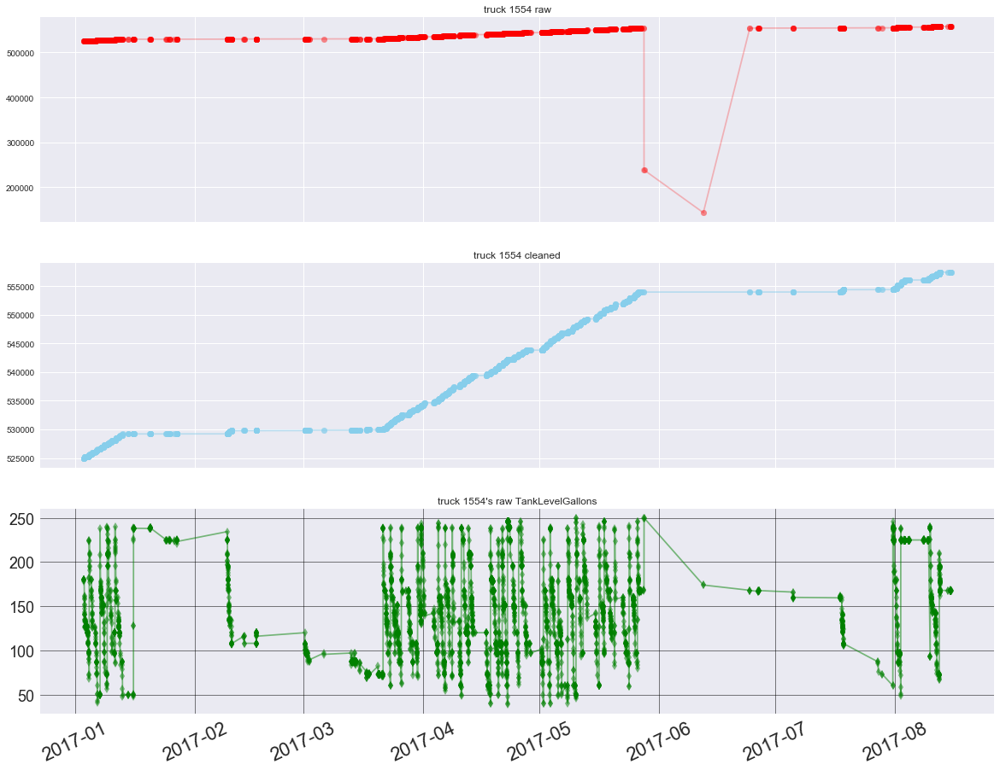

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1558 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  10289.79

------
Truck  1558 has had  11 drivers.
And they are:  {nan, 'JENCA', 'DIXGR', 'SHOP1', 'LUCJ', 'PETL', 'HATA', 'HELB', 'NOELA', 'ALBJ', 'DAVJO'}


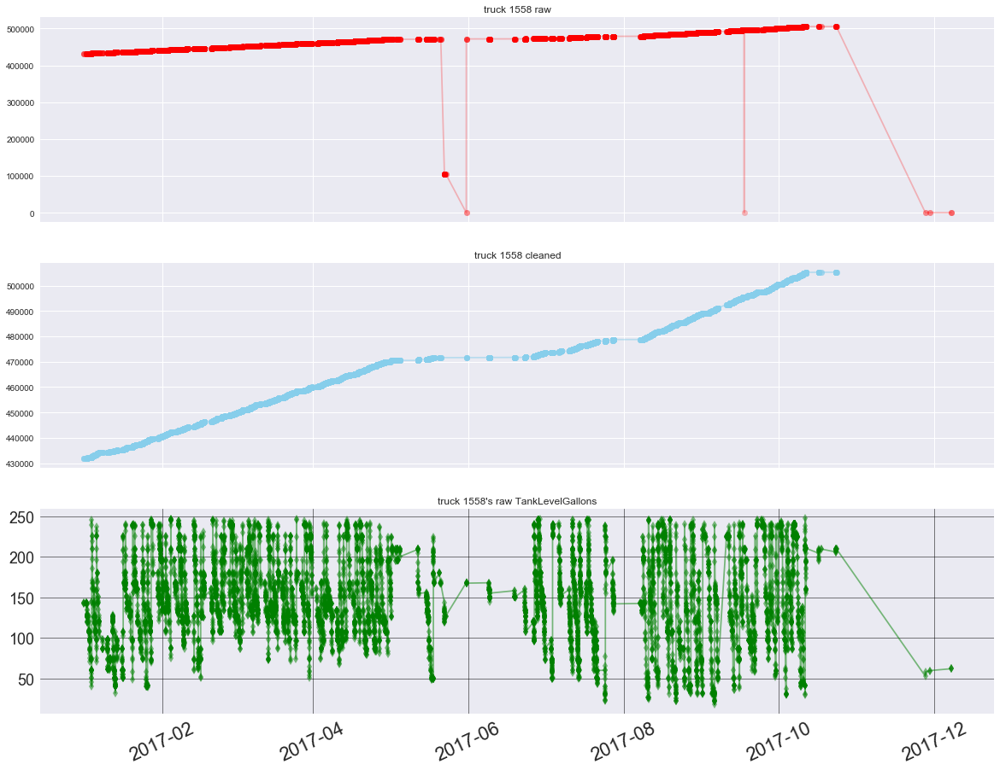

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1565 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  5395.56

------
Truck  1565 has had  5 drivers.
And they are:  {nan, 'SHOP1', 'BAYJ', 'PAGC', 'FISJ'}


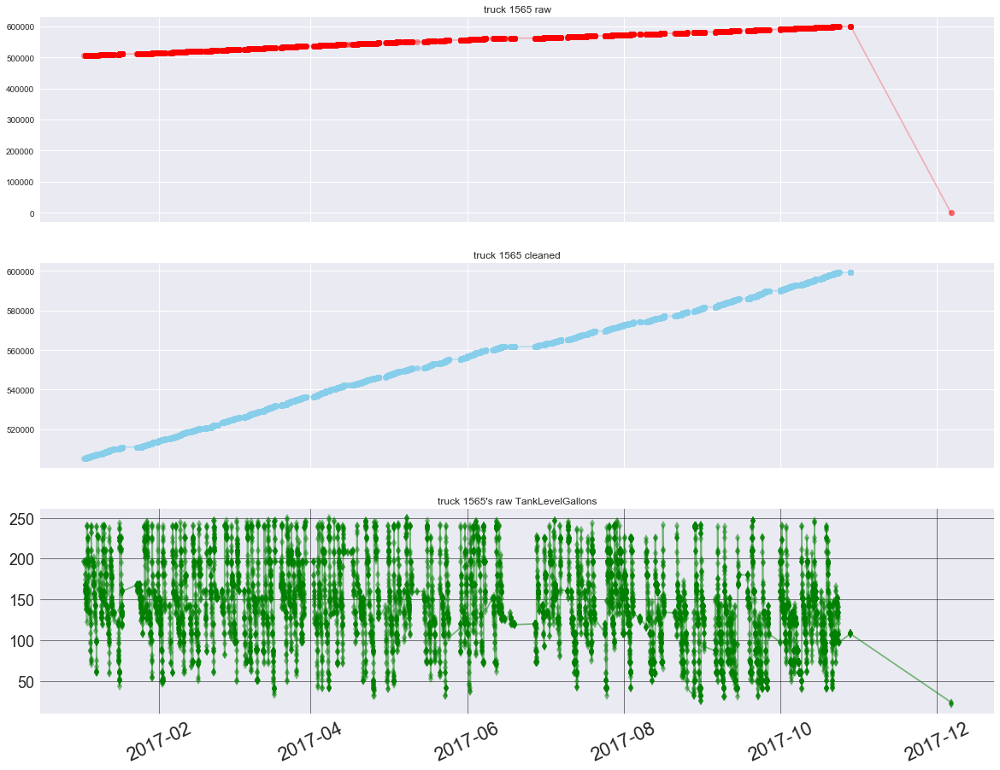

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1572 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  5971.15

------
Truck  1572 has had  5 drivers.
And they are:  {nan, 'BRARAY', 'LANWA', 'TALM', 'ADAR'}


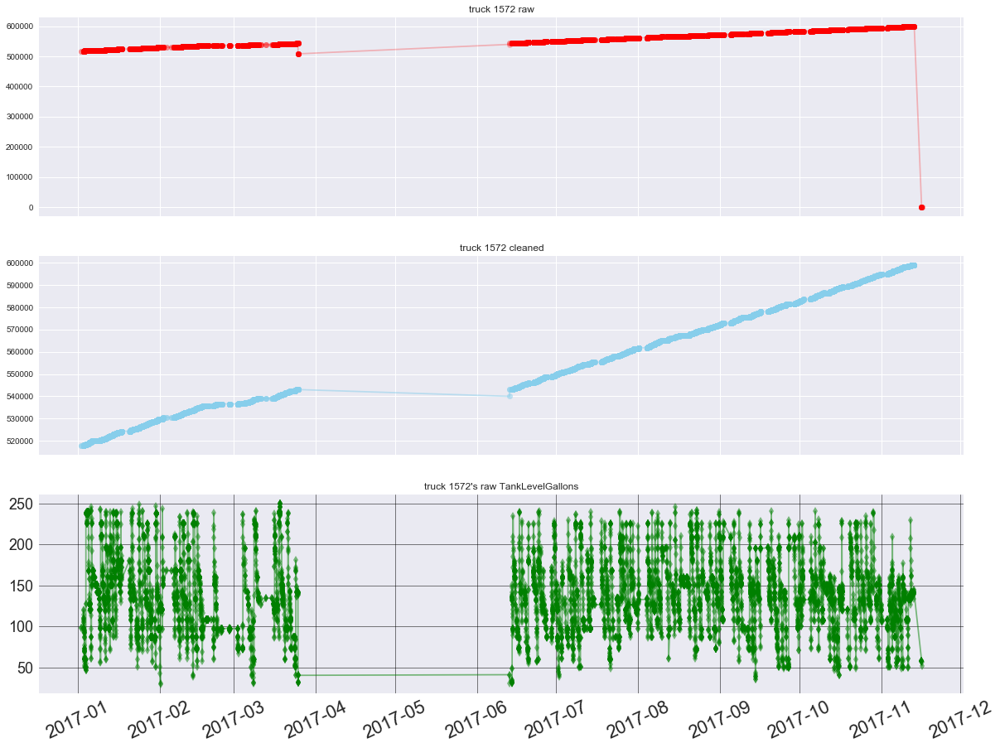

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1579 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  5680.95

------
Truck  1579 has had  8 drivers.
And they are:  {nan, 'JACCE', 'DANR', 'CLIJ', 'CLEWI', 'WARDA', 'GODJ', 'POGB'}


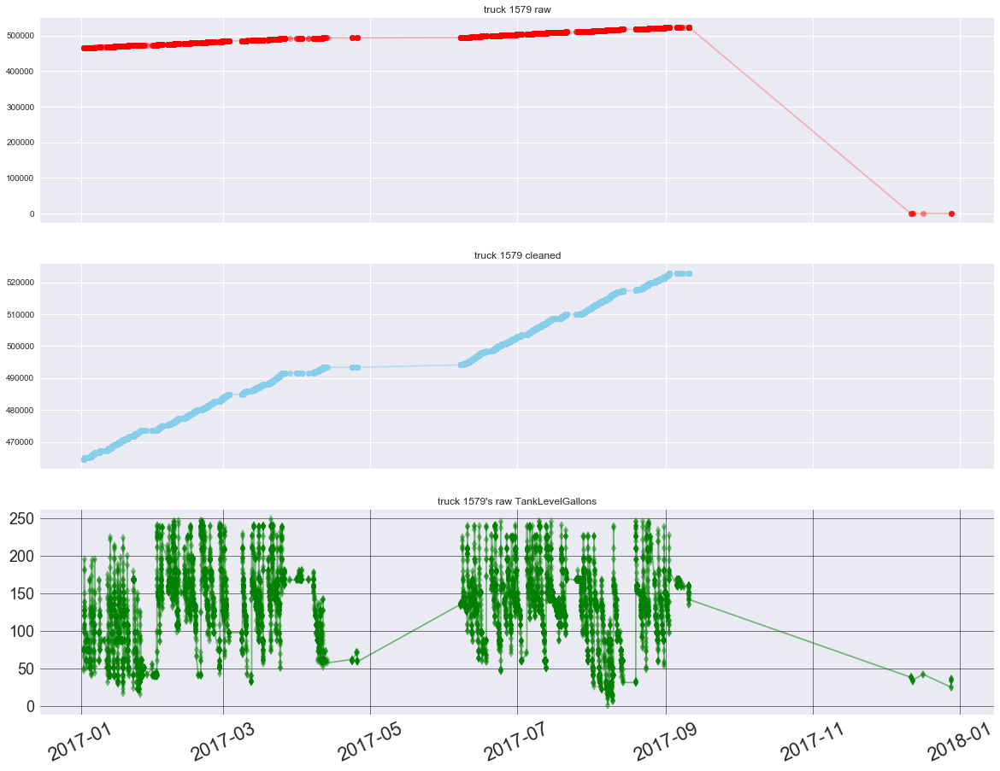

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1580 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  9946.71

------
Truck  1580 has had  20 drivers.
And they are:  {nan, 'WILGEO', 'SMIGA', 'LAYJ', 'FELC', 'WARDA', 'BROD03', 'BULR', 'HARWI', 'BELT', 'SHOP1', 'ROSE', 'HILB', 'FRYR', 'GOOA', 'GUSC', 'ARNMA', 'MEID', 'SHATHO', 'GRAJOH'}


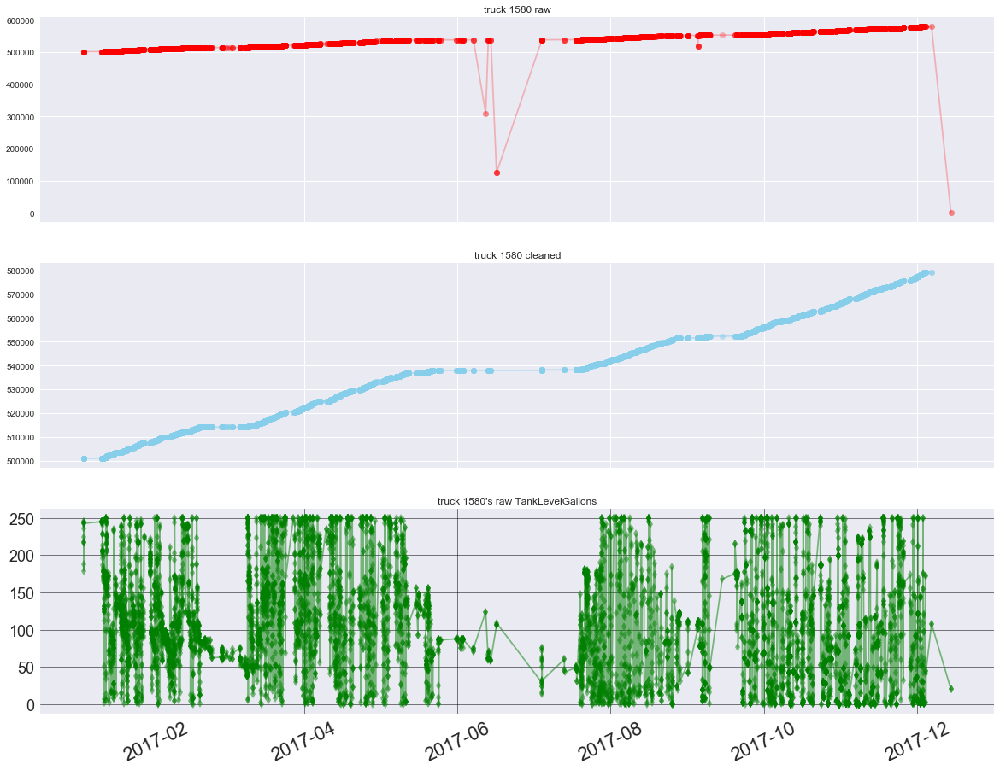

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1582 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  15950.49

------
Truck  1582 has had  8 drivers.
And they are:  {nan, 'ESTD', 'SHOP1', 'HUFAU', 'SHAMAR', 'SMID', 'HILB', 'DAVCA'}


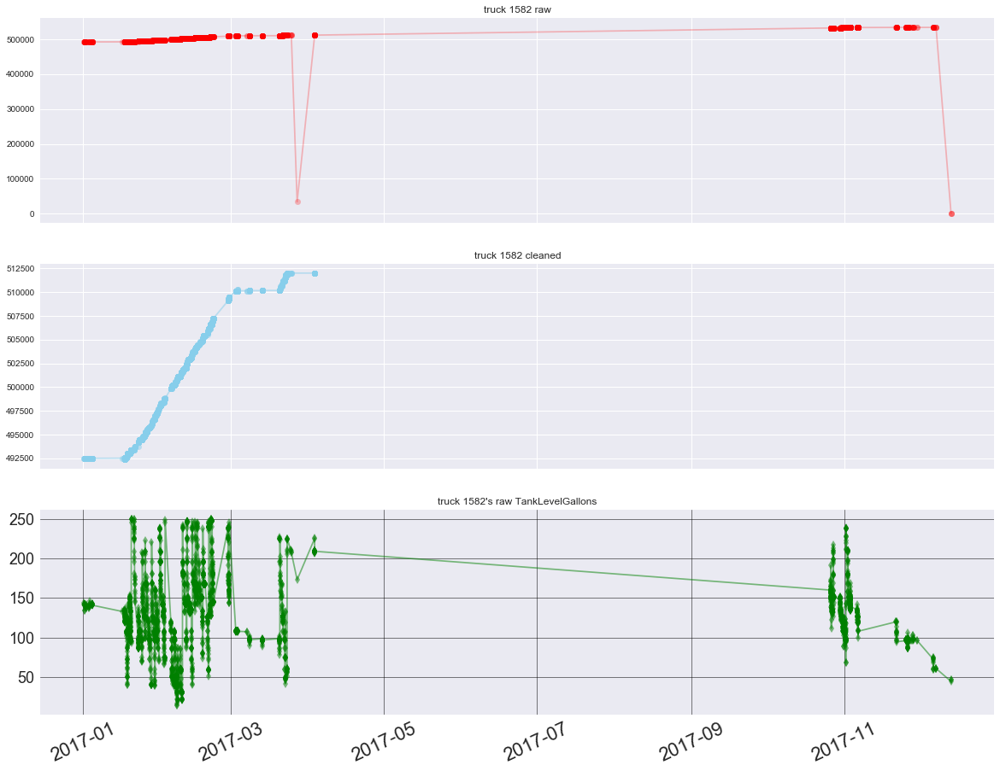

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1597 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  5135.77

------
Truck  1597 has had  10 drivers.
And they are:  {nan, 'BRERI', 'FRACH', 'SHOP1', 'LOUR', 'JOHTE', 'THOMIC', 'HARKEV', 'STRAND', 'WHIGR'}


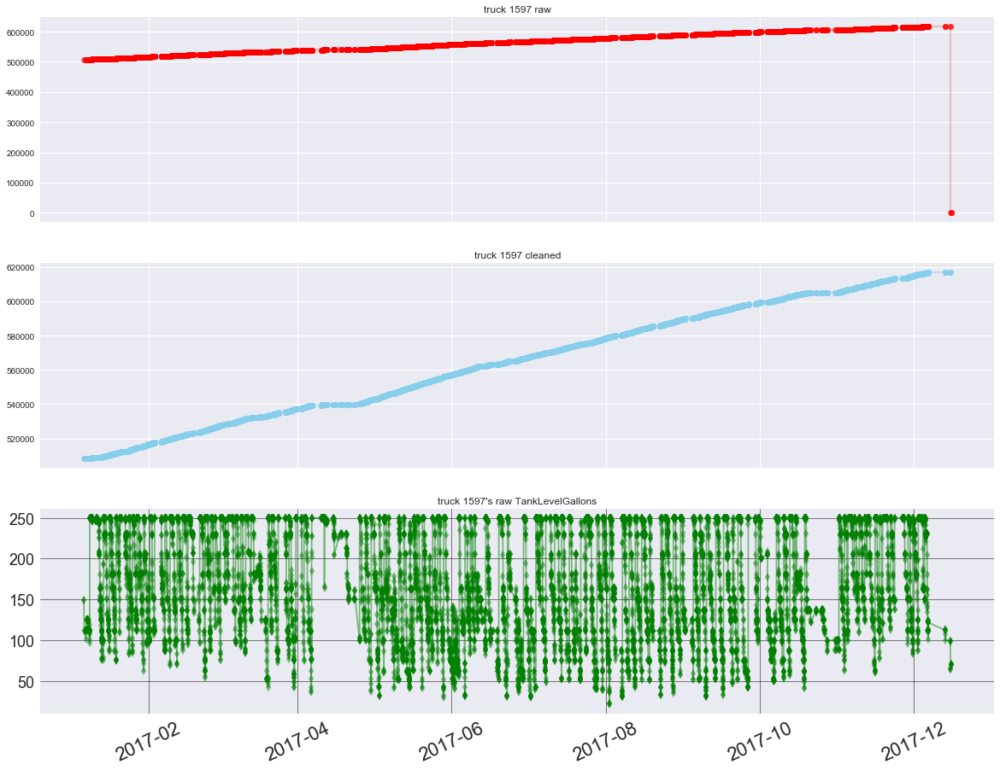

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1598 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  6408.38

------
Truck  1598 has had  10 drivers.
And they are:  {nan, 'CRAMI', 'GIBJ', 'SHOP1', 'MORI', 'THODAN', 'OVEM', 'MANBE', 'PERAL', 'RIFJ'}


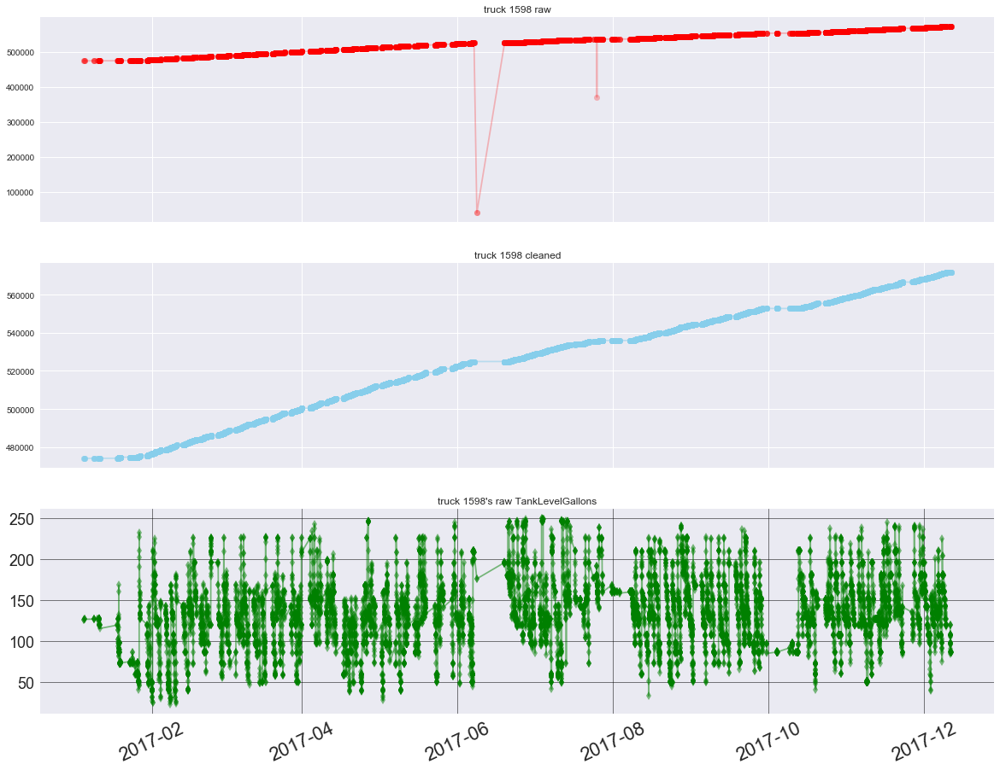

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1599 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  5179.25

------
Truck  1599 has had  4 drivers.
And they are:  {nan, 'QUID', 'MORGA', 'SHOP1'}


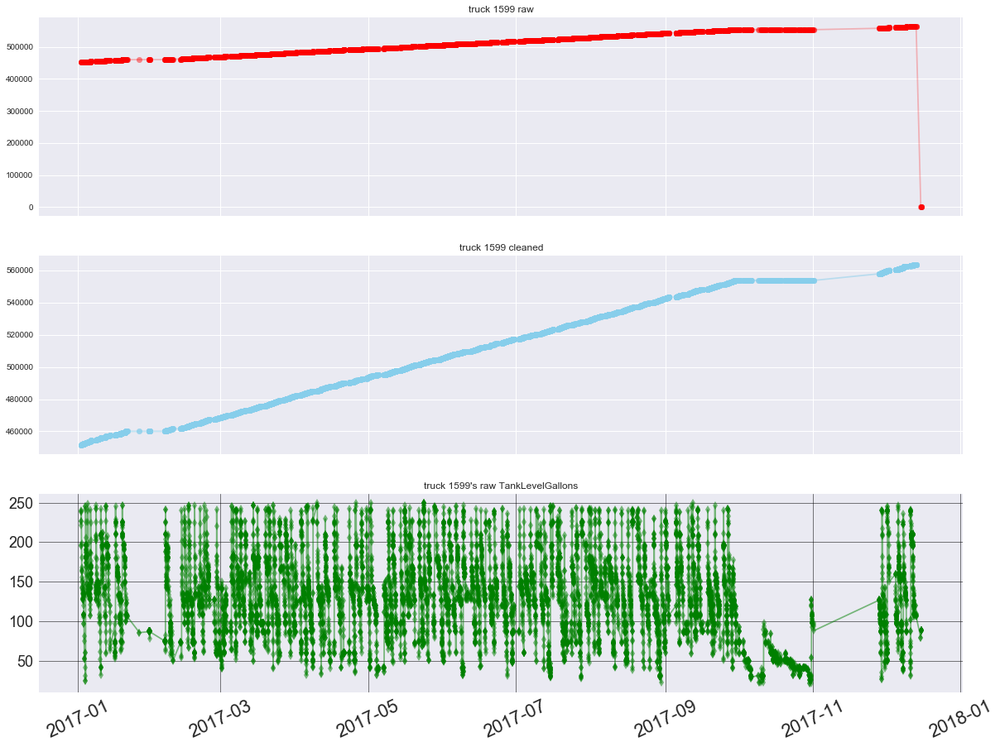

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1626 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  5329.31

------
Truck  1626 has had  5 drivers.
And they are:  {nan, 'POGB', 'ROSE', 'NOEL', 'SIMDA'}


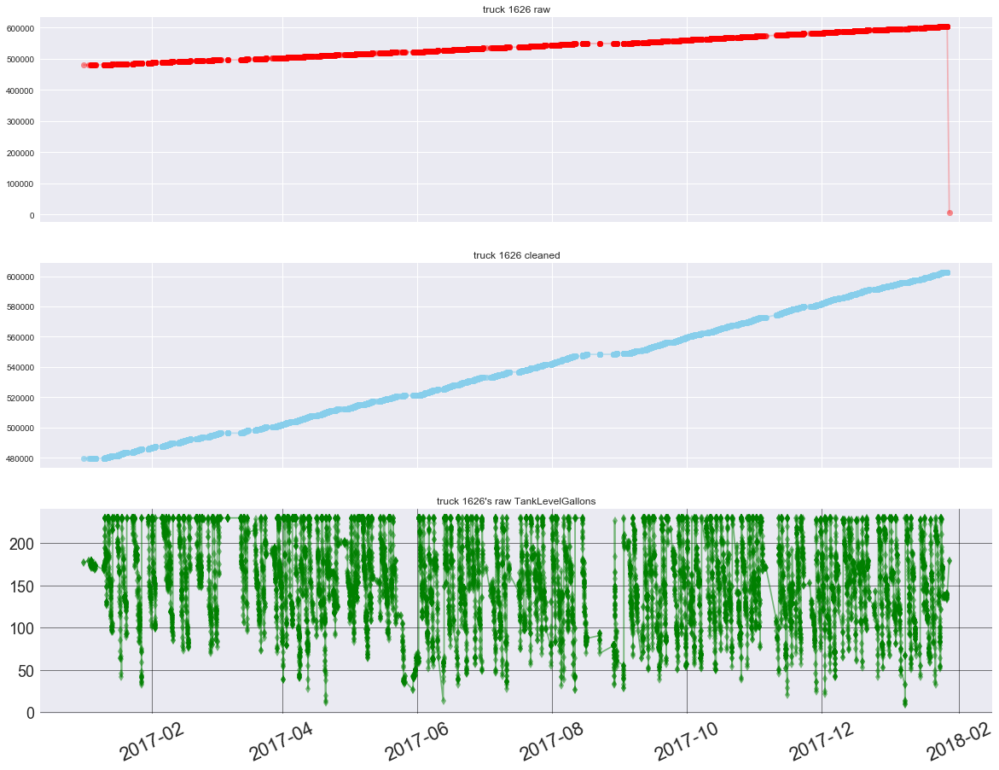

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1668 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  5849.66

------
Truck  1668 has had  8 drivers.
And they are:  {nan, 'DIXGR', 'SHOP1', 'SANJON', 'GREDAV', 'BARCR', 'LUCM', 'DIXP'}


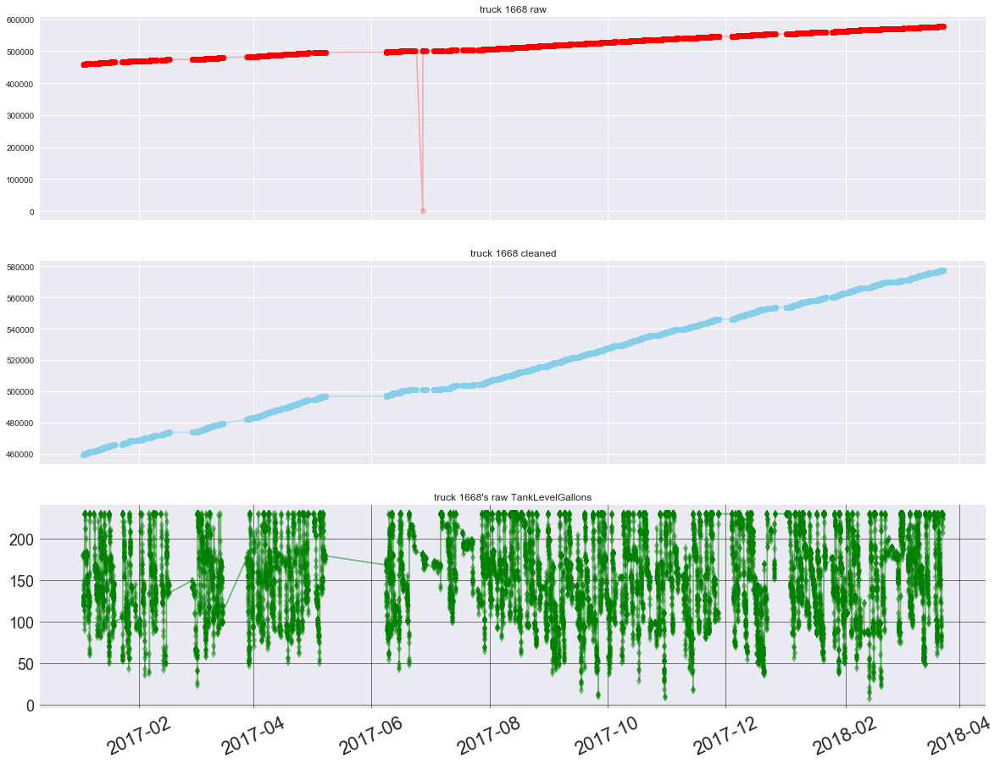

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1682 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  8048.17

------
Truck  1682 has had  7 drivers.
And they are:  {nan, 'SHOP1', 'MAIK', 'ROLRA', 'FLIE', 'CALBI', 'FRAH'}


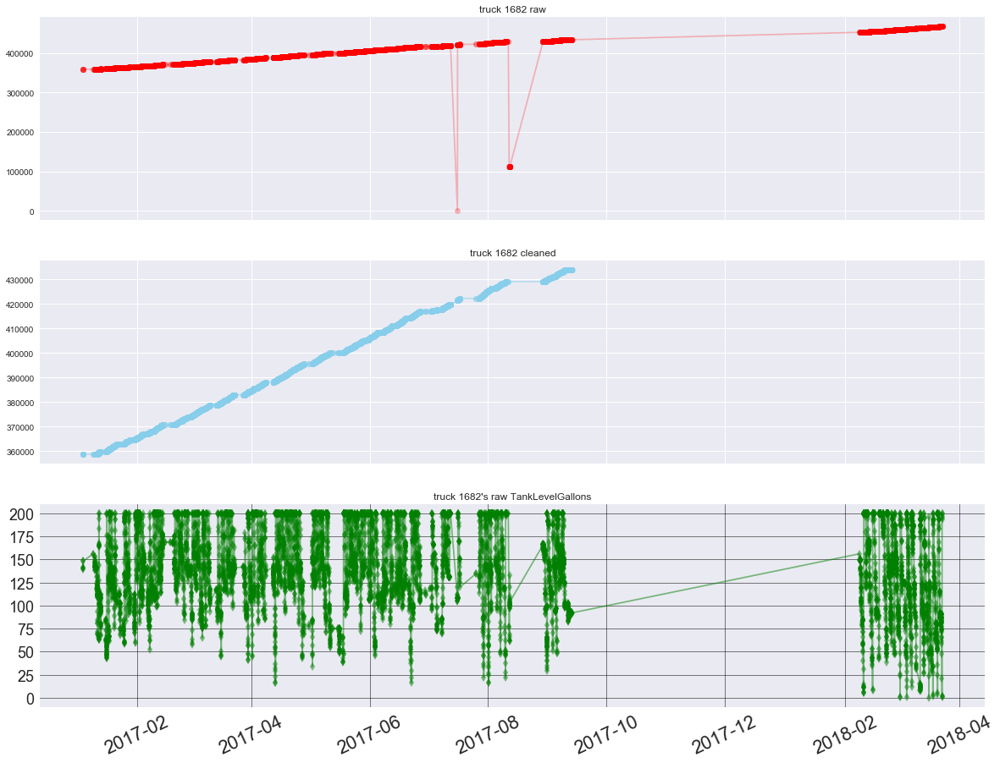

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1771 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  6370.72

------
Truck  1771 has had  8 drivers.
And they are:  {nan, 'ALSA', 'LAYJ', 'SHOP1', 'FELC', 'PRUH', 'BURBO', 'GUTJ'}


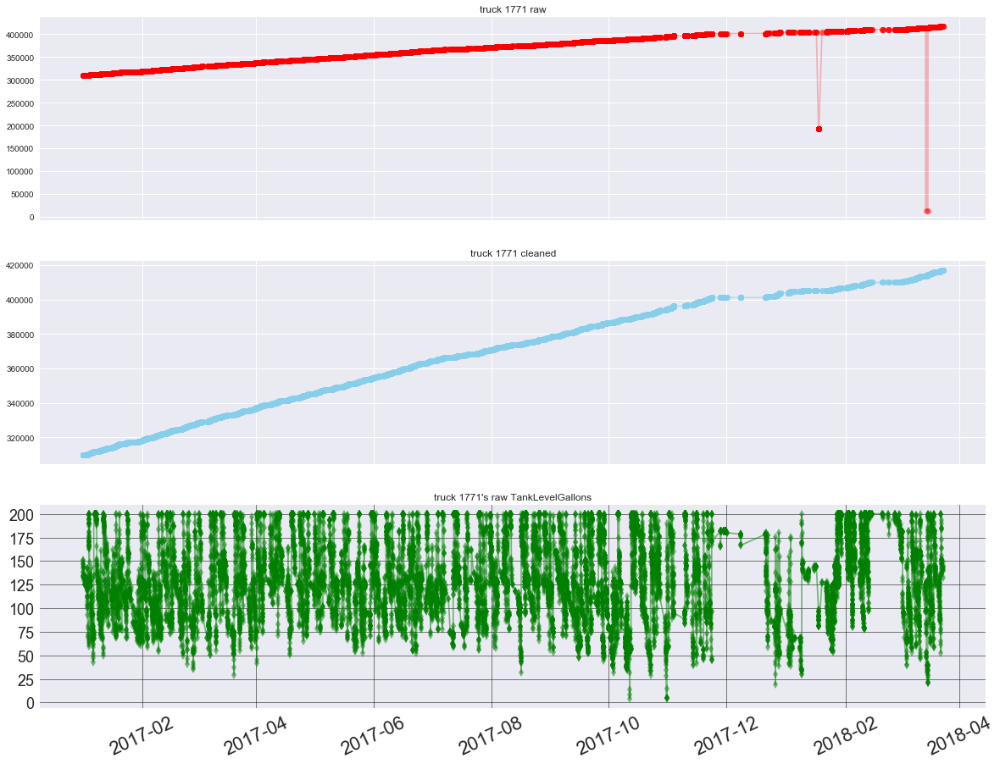

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1782 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  3585.07

------
Truck  1782 has had  4 drivers.
And they are:  {nan, 'MURJO', 'HAZSC', 'SHOP1'}


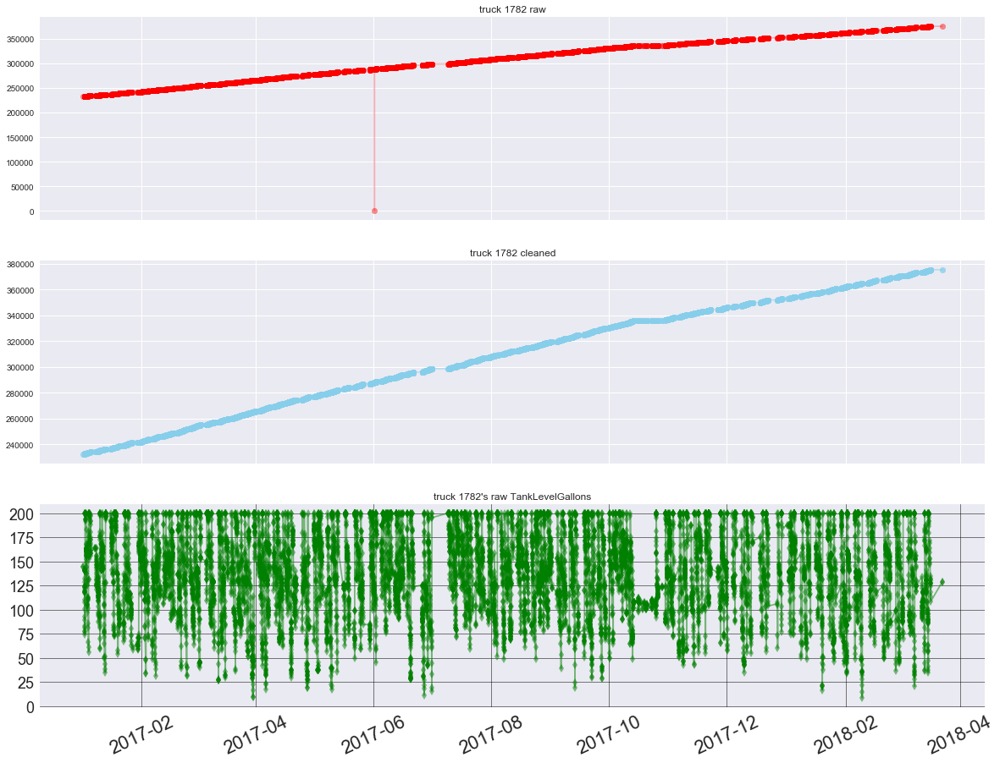

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1789 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  3429.01

------
Truck  1789 has had  8 drivers.
And they are:  {nan, 'KINROB', 'BROTI', 'DAVKE', 'GALH', 'JONQ', 'PARW', 'WRIJON'}


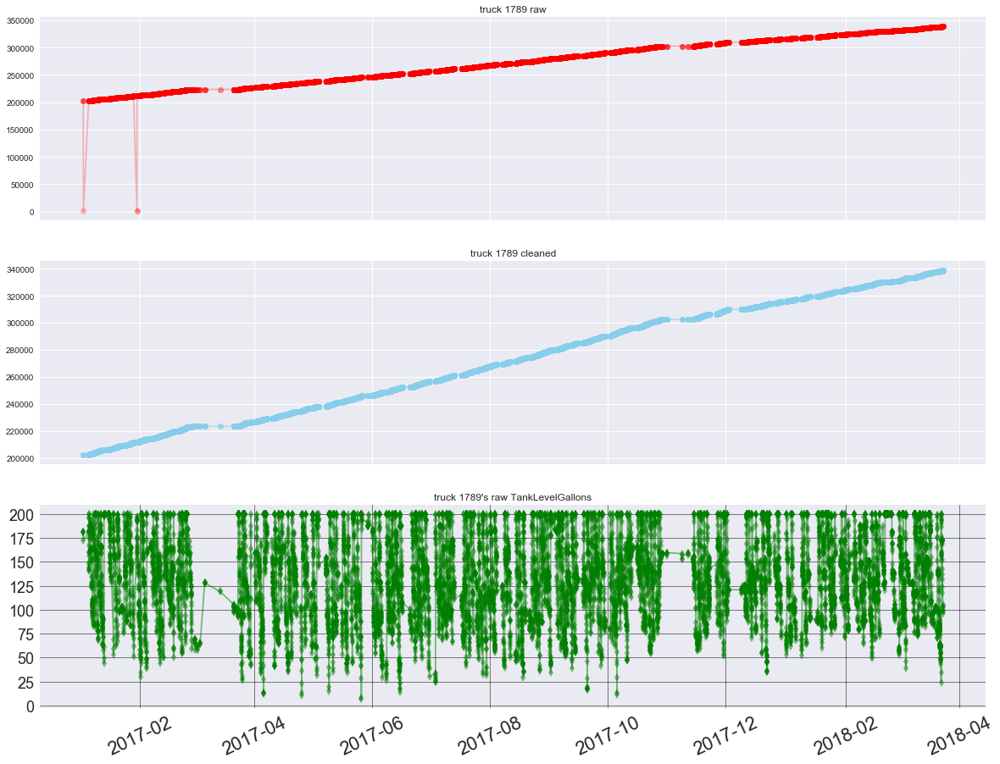

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1849 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  3512.64

------
Truck  1849 has had  4 drivers.
And they are:  {nan, 'GLOJE', 'PEIJ', 'GRAJOH'}


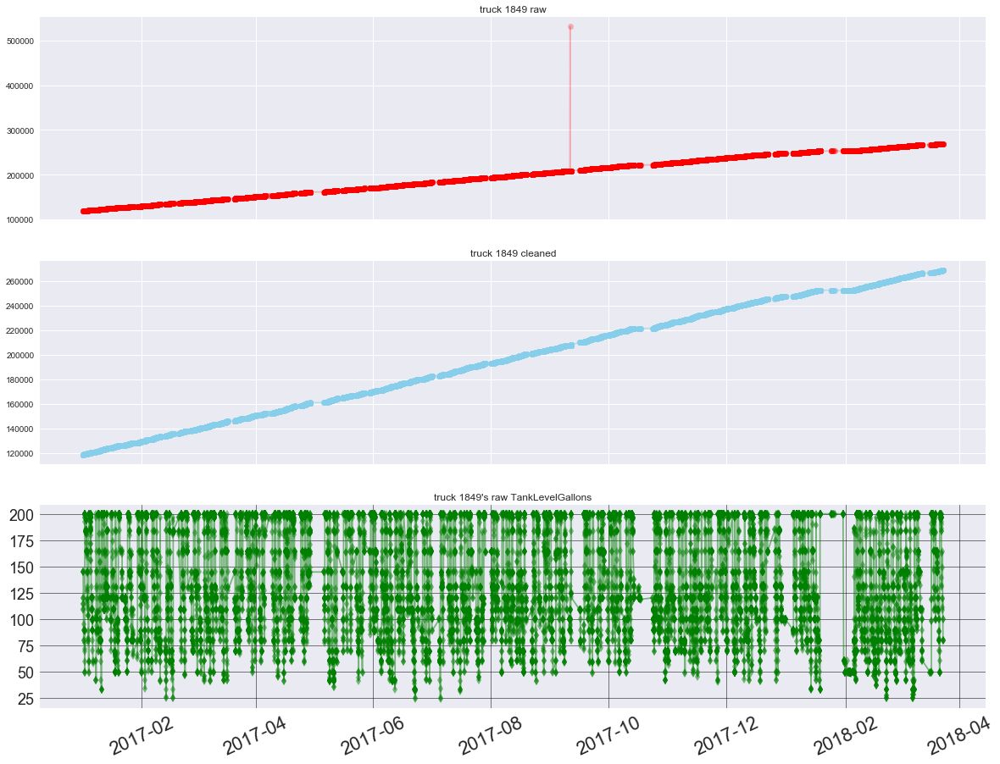

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1859 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  3579.43

------
Truck  1859 has had  3 drivers.
And they are:  {'EDWTI', nan, 'WARDE'}


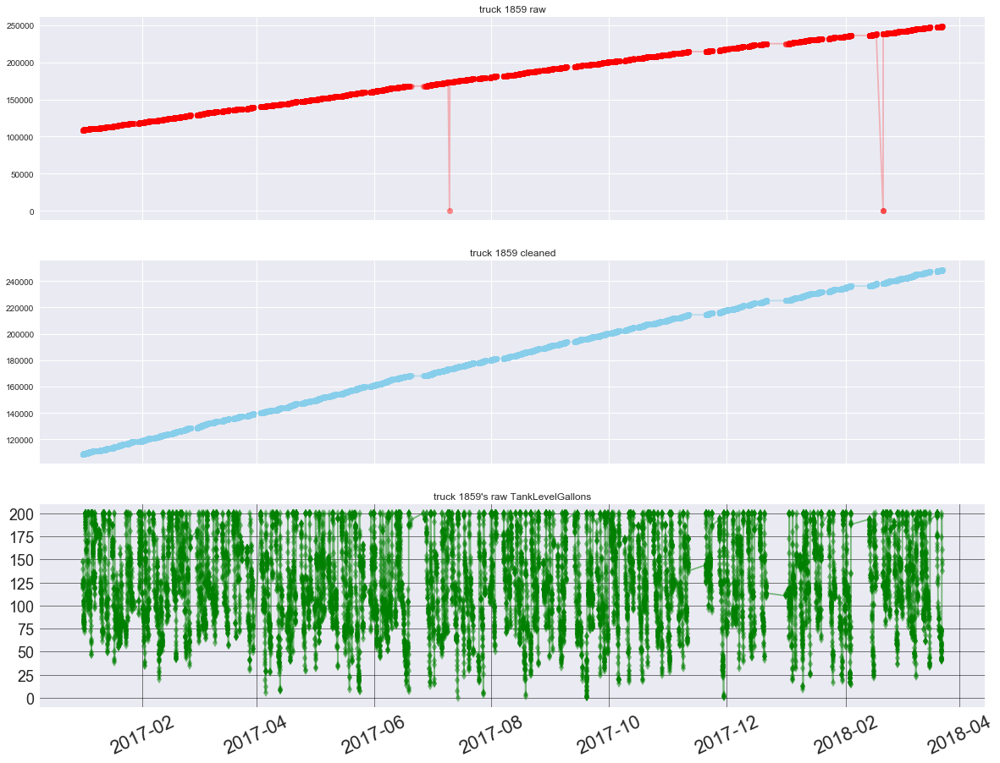

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1894 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  1108.09

------
Truck  1894 has had  4 drivers.
And they are:  {nan, 'CHED', 'BROTI', 'SHOP1'}


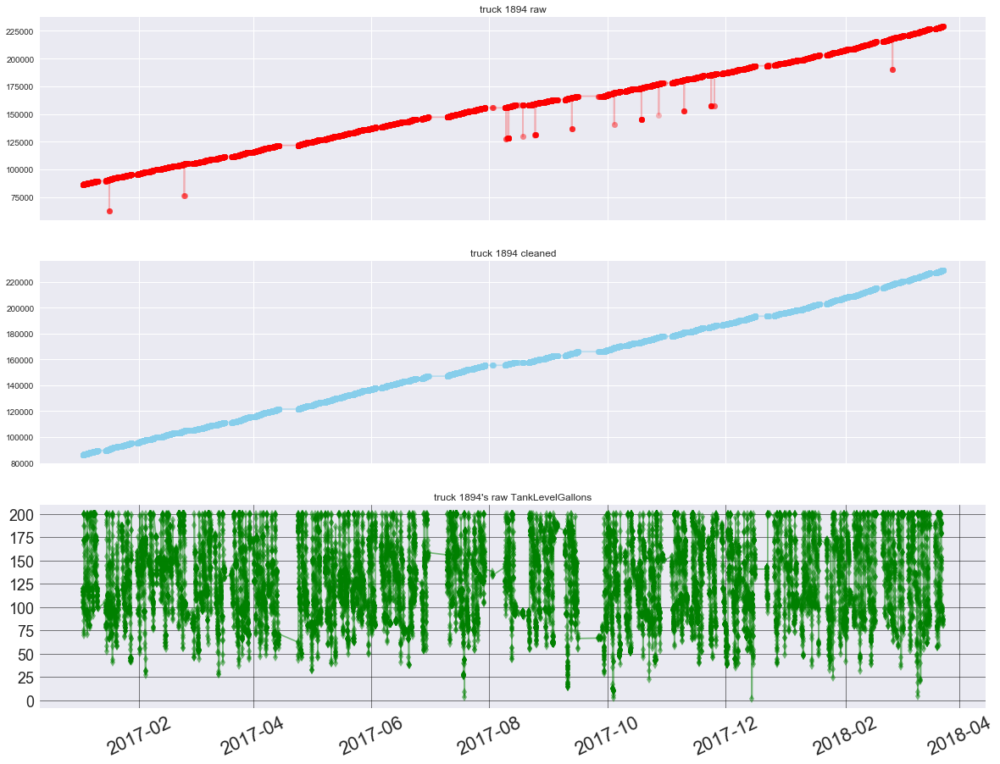

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1899 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  1027.53

=======>WATCHOUT<=======, function flagged  28.34 % of  16365 raw rows for dropping
------
Truck  1899 has had  2 drivers.
And they are:  {nan, 'NANP'}


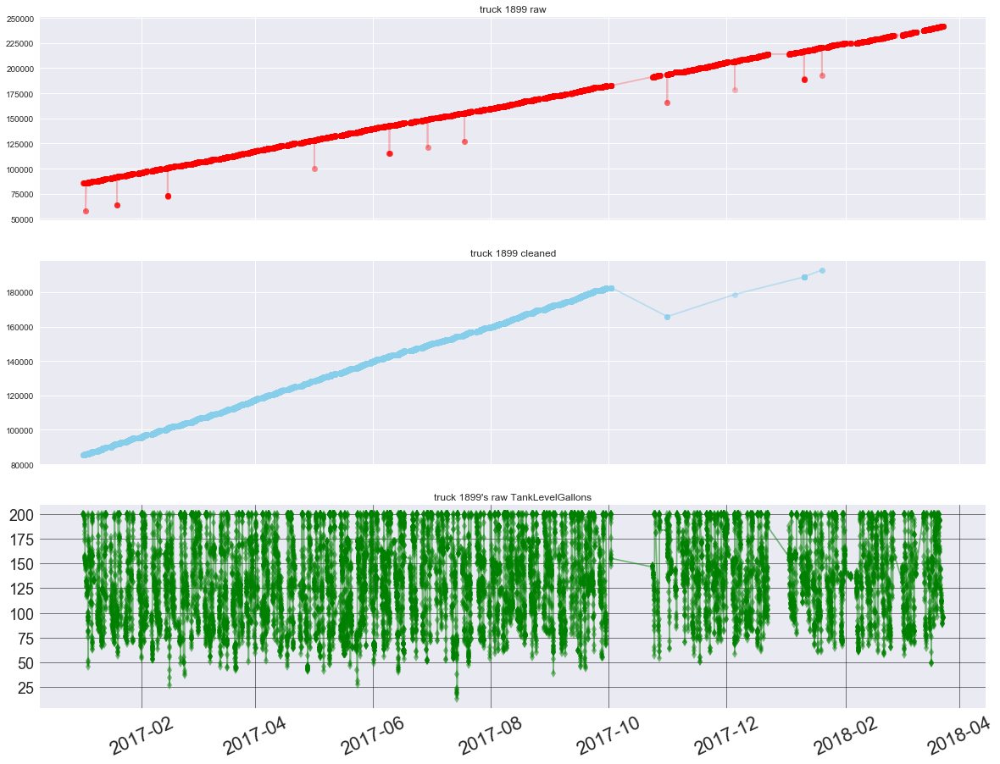

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1917 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  714.18

=======>WATCHOUT<=======, function flagged  92.35 % of  13713 raw rows for dropping
------
Truck  1917 has had  8 drivers.
And they are:  {nan, 'SHOP1', 'NORPA', 'BOUB', 'DAVCA', 'OWESH', 'SHOP3', 'CARD'}


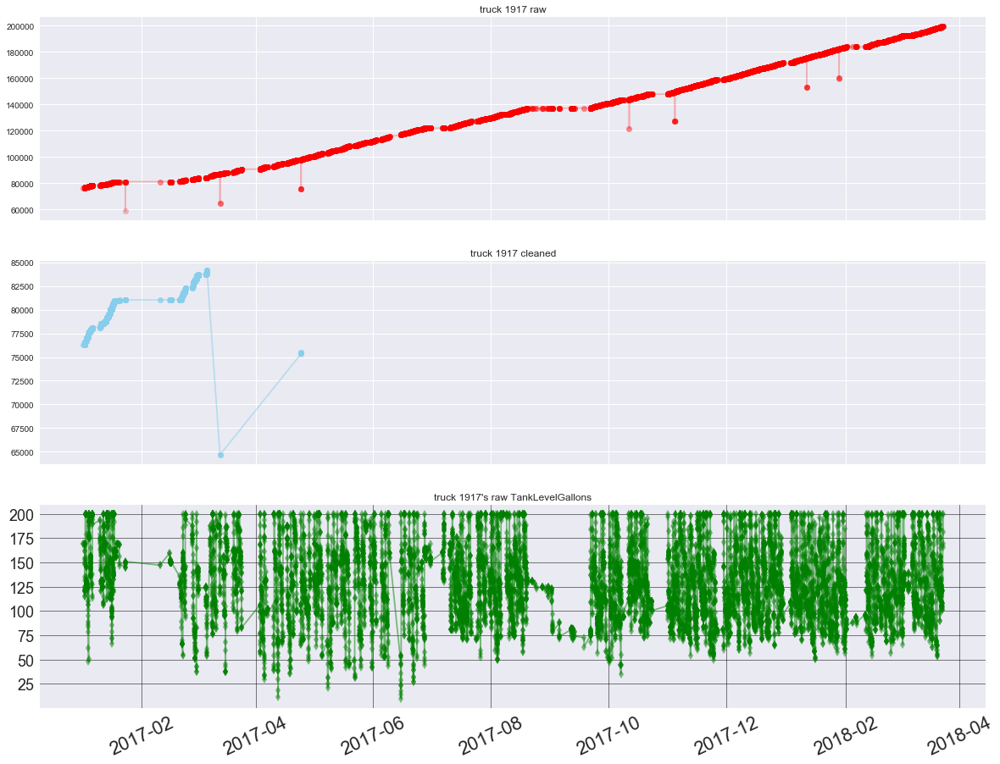

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1919 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  1822.25

------
Truck  1919 has had  2 drivers.
And they are:  {nan, 'BONZ'}


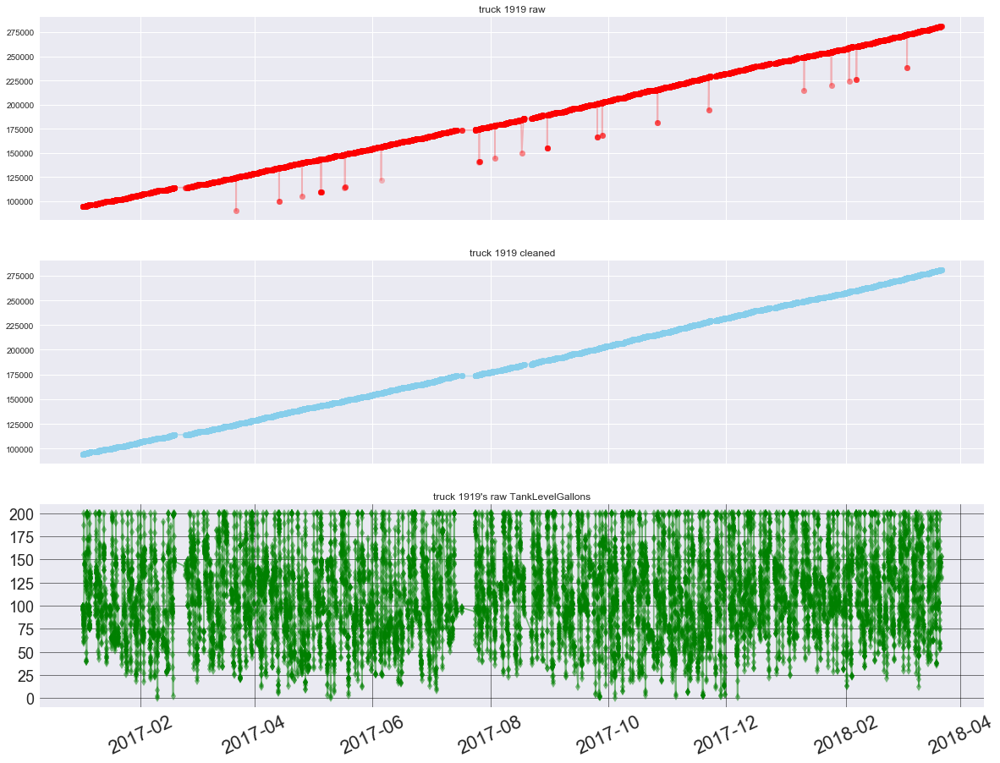

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1924 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  2615.73

------
Truck  1924 has had  3 drivers.
And they are:  {nan, 'HERV', 'GIBROY'}


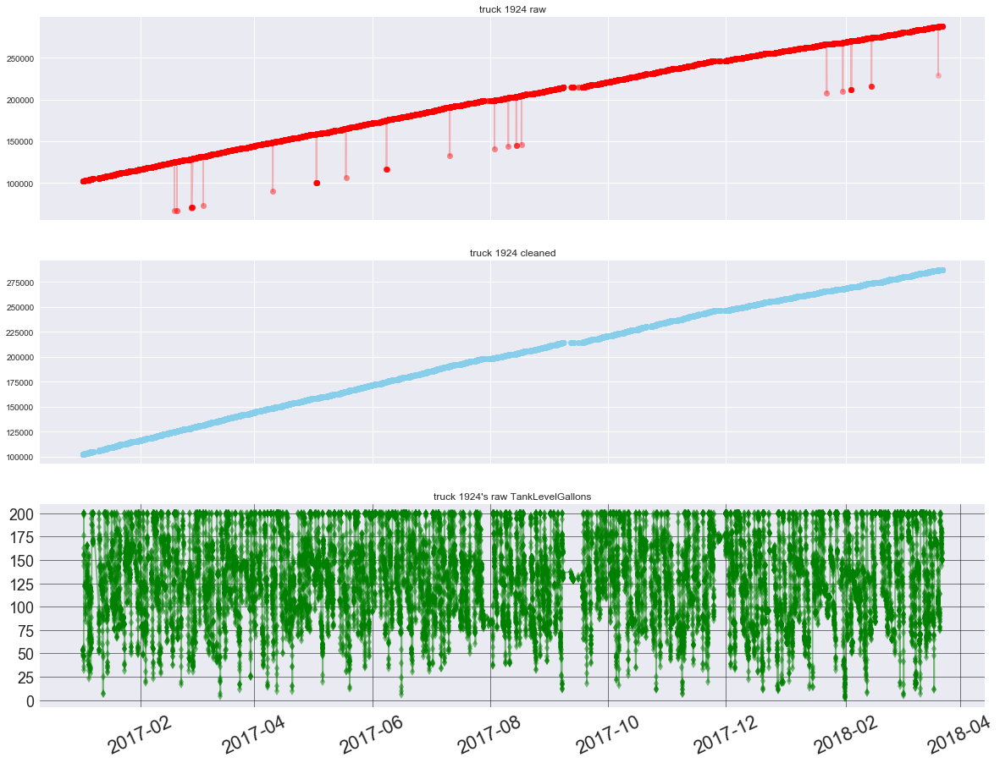

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1933 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  1918.71

------
Truck  1933 has had  4 drivers.
And they are:  {nan, 'LARR', 'SHOP1', 'LEVS'}


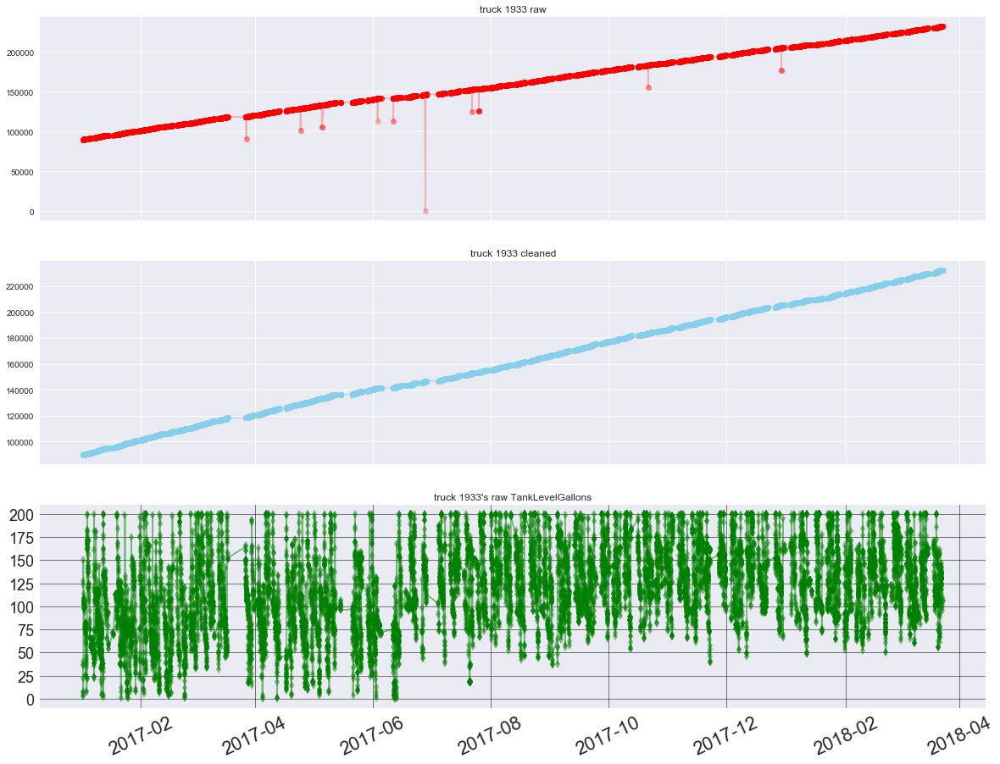

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1940 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  214.0

------
Truck  1940 has had  2 drivers.
And they are:  {nan, 'COOMI'}


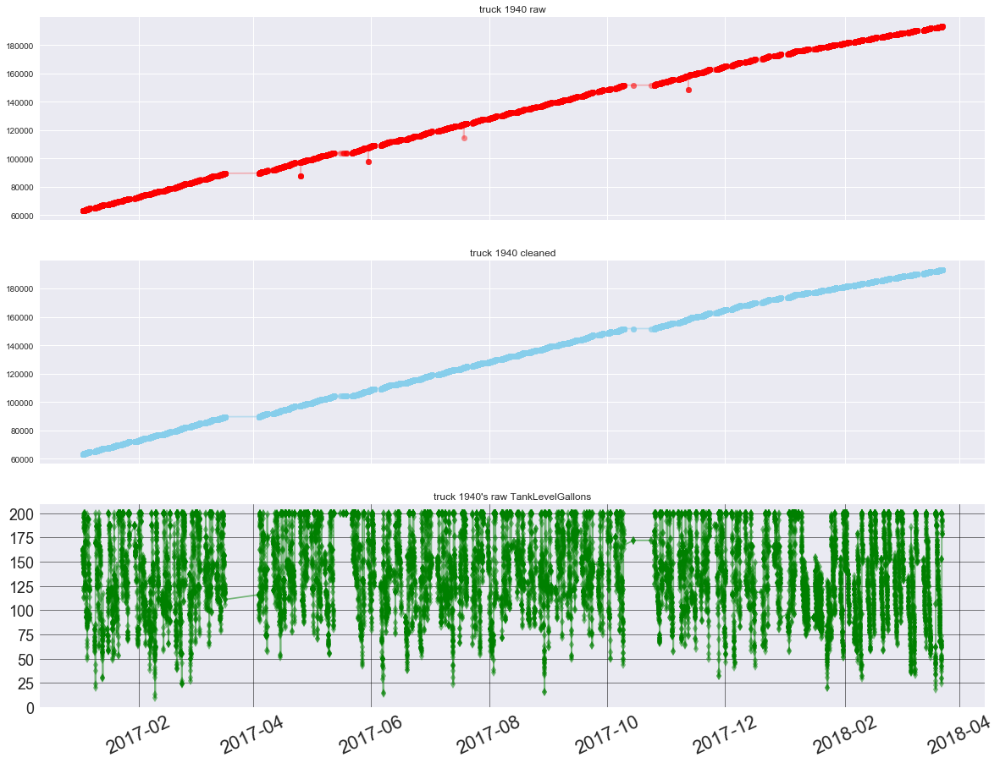

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 2011 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  4680.94

---- !-!-!-!-!-!-!-!-!-!-!-!-!-!WATCHOUT the first Odometer reading:  555197.2
---- is over 3 Odometer standard Deviations from Odometer.median() =  70870.25
---- >>>> Do you want to set the initial_state to 'anomalous'? [yes] [no] yes
-- initial state set as  anomalous
-- median Odometer reading =  70870.25
=======>WATCHOUT<=======, function flagged  30.12 % of  14142 raw rows for dropping
------
Truck  2011 has had  8 drivers.
And they are:  {nan, 'SHOP1', 'CLAMI', 'HODJE', 'SUTD', 'ELLTH', 'HERV', 'FREDA'}


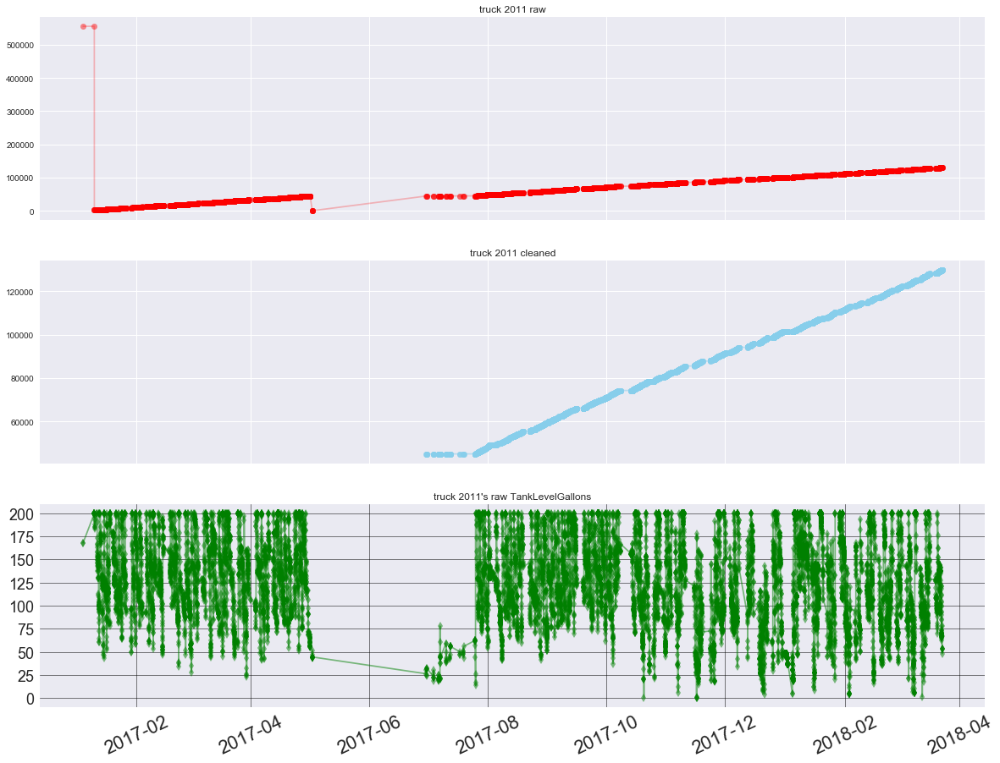

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 2099 ---------------------------------------------------\

-- set margin to Odometer.diff().std() =  771.0

=======>WATCHOUT<=======, function flagged  94.84 % of  1976 raw rows for dropping
------
Truck  2099 has had  3 drivers.
And they are:  {'GRAJU', nan, 'SHOP1'}


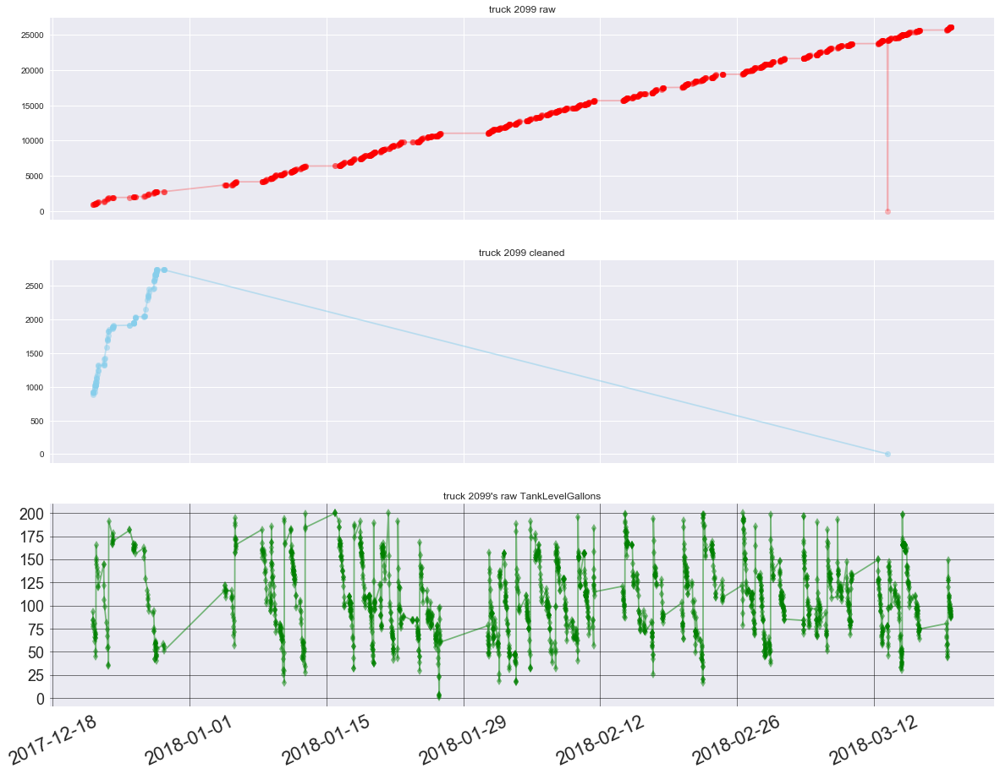

\----------------------------------------------------\/------------------------------------------------/



In [180]:
for t in troublesome_odometers:
    slice_clean_plot(events_levels_df, t, verbose = False, vigilant = True, interactive = False)

#### Enhance slice_clean_plot2

In [268]:
def slice_clean_plot_2(df, t, start_date = None, end_date = None, verbose = False, vigilant = False,
                    interactive = False):
    '''Takes an events_levels_df and a specified t = truck and optional date parameters.
    defines that truck's slice, defines the cleaning flags for that slice, 
    plots the data raw and cleaned for visual inspection'''
    
    ##########--- Pending Enhancements ----################
    '''
    To do:
    1. Plot the data before raising vigilance-warnings and asking user to modify the parameters.
        a. I might be able to transfer the "Reporting Results and Handling Special Cases" code 
        from the flag_anomal_odom_rows_4 function.
    2. Plot sns facet grid where each row is a truck and each column is a month.
        a. this should help with the readability of the fuel tank plot
    3.  make use of the date columns?
        a. Ideally I would like to have input sliders that let the user interact with the plot
    '''
    ############----------------------------##############
    
######-- Slice 🔪----------------------------------------------------##########
    #make a raw slice for that truck with a fresh index
    t_raw_slice_df = df[df.truck == t].reset_index()
    print('')
    print(" /----------------------------------------------/\\---------------------------------------------------\\")
    print("/--------------------------------------------", t, "---------------------------------------------------\\")

#---generate cleaning flags for that truck
    flags = flag_anomal_odom_rows_4(t_raw_slice_df[['Odometer', 'truck']], 
                                    verbose = verbose, vigilant = vigilant, interactive = interactive)
    
######-- Clean 🛁----------------------------------------------------########
    t_slice_cleaned_df = t_raw_slice_df[flags].reset_index() #### Could combine this snippet with flags above
    
####---- Generate Insightful features ⚗️--------------------################
    
    #compute the 
    t_slice_cleaned_df['GallonsDiff'] = t_slice_cleaned_df.TankLevelGallons.diff()
    t_raw_slice_df['GallonsDiff'] = t_raw_slice_df.TankLevelGallons.diff()

    #add the 
    t_slice_cleaned_df['OdomDiff'] = t_slice_cleaned_df.Odometer.diff()
    t_raw_slice_df['OdomDiff'] = t_raw_slice_df.Odometer.diff()
    
    #compute the 
    t_slice_cleaned_df['event_mpg'] = [round(m/g, 2) for m, g in zip(t_slice_cleaned_df.OdomDiff,
                                                                        t_slice_cleaned_df.GallonsDiff)]
    t_raw_slice_df['event_mpg'] = [round(m/g, 2) for m, g in zip(t_raw_slice_df.OdomDiff,
                                                                 t_raw_slice_df.GallonsDiff)]
        
    #####add ax4 as the mpg
    
#####------ Plot 📈------------------------------------------ ############
    fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(ncols = 1, nrows = 5,
                                   #sharey = True, 
                                   sharex = True,
                                   figsize = (20,15))
    
    plt.xticks(rotation = 25, fontsize = 22)
    plt.yticks(fontsize = 18)
    plt.grid(True, 'major', 'both', c = 'k', alpha = 0.5)
    plt.tick_params(axis = 'both', 
                    which = 'both', right = True,
                   labelbottom = True, labelleft = True)
    
    #plot the raw odometer
    ax1.plot(t_raw_slice_df.EventTimeStamp, 
             t_raw_slice_df.Odometer,
             alpha = 0.25,
             color = 'red',
             marker = 'd')
    ax1.set_title('truck ' + str(t) + ' raw Odometer') 
    
    print('------')
    print('Truck ', t, 'has had ', len(set(t_raw_slice_df.DriverID)), 'drivers.')
    print('And they are: ', set(t_raw_slice_df.DriverID))
    
    #plot the cleaned odometer
    ax2.plot(t_slice_cleaned_df.EventTimeStamp, 
             t_slice_cleaned_df.Odometer, 
             alpha = 0.5, 
             color = 'blue',
             marker = 'o')
    ax2.set_title('truck ' + str(t) + ' cleaned Odometer')

    #plot the raw Galons
    ax3.plot(t_raw_slice_df.EventTimeStamp, 
             t_raw_slice_df.TankLevelGallons,
             alpha = 0.5,
             color = 'green',
             marker = 'd') 
    ax3.set_title('truck ' + str(t) + "'s raw TankLevelGallons")
    
    ax4.plot(t_raw_slice_df.EventTimeStamp,
             t_raw_slice_df.event_mpg,#.replace([np.inf, -np.inf], 66.6)
             alpha = 0.5,
             color = 'darkgreen',
             marker = '.'
            )
    ax4.set_title('truck' + str(t) + 's raw event MPG')
    
    '''ax4.hist(t_slice_cleaned_df.mpg)'''
    ax5.plot(t_slice_cleaned_df.EventTimeStamp,
             t_slice_cleaned_df.event_mpg,#.replace([np.inf, -np.inf], 66.6)
             alpha = 0.5,
             color = t_slice_cleaned_df.DriverID,
             #color = 'lightgreen',
             marker = '.'
            )
    ax5.set_title('truck' + str(t) + 's "cleaned" event MPG')
    #or I could also make a swarm plot
    #color code it by driver
    
    plt.show()
    print('\\----------------------------------------------------\\/------------------------------------------------/')
    print('')

# try slice_clean_plot_2 function on the troublesome odometers


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1554 ---------------------------------------------------\
2018-05-07 03:40:17.659055 commencing flaging function (by reseting index).

-- set margin to Odometer.diff().std() =  8320.83

-- entering loop at  2018-05-07 03:40:17.660769
truck  1554  entered anomaly at i = 3468 2018-05-07 03:40:17.812467
truck  1554  exited anomaly at i= 3473 2018-05-07 03:40:17.813411
------------------
flagged  5 for removal.
That is:  0.12 % of  4001 raw rows.

With a margin of discrimination of :::::::::::::: 8320.83

print completed flagging function at  2018-05-07 03:40:17.833092 flagging took:  0:00:00.174042
------
Truck  1554 has had  8 drivers.
And they are:  {nan, 'HILF', 'SHOP1', 'FISDA', 'BROR01', 'LOTG', 'HARMIC', 'JOYGE'}


/Users/paulomartinez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in double_scalars
/Users/paulomartinez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: divide by zero encountered in double_scalars
/Users/paulomartinez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in double_scalars
/Users/paulomartinez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:47: RuntimeWarning: divide by zero encountered in double_scalars


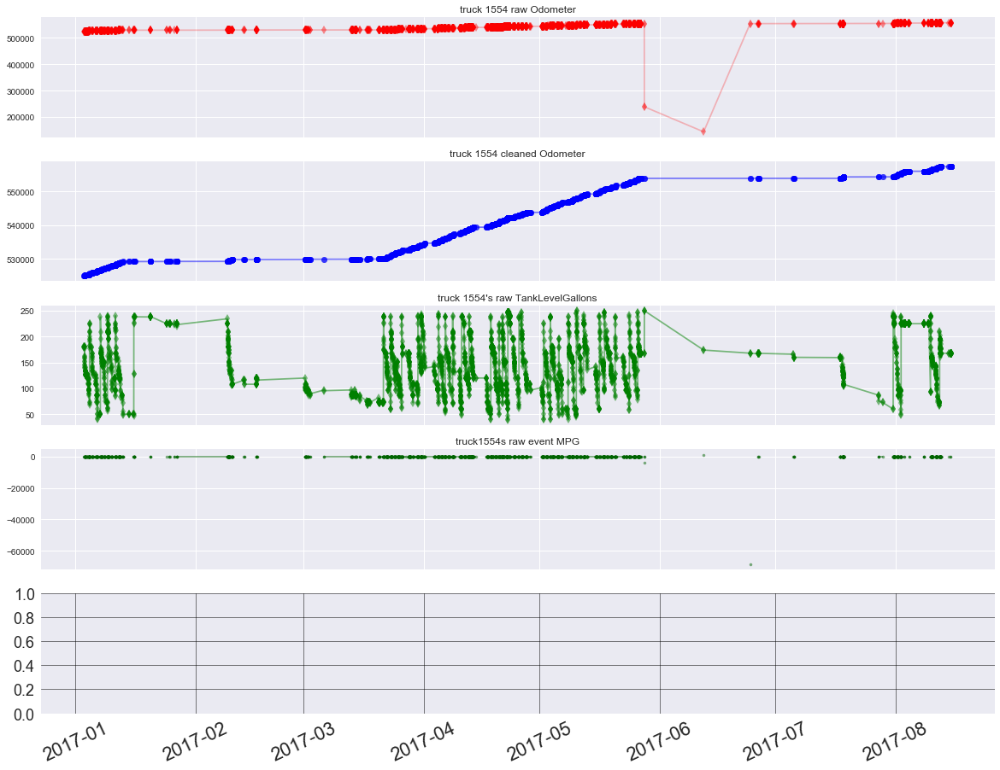

ValueError: Invalid RGBA argument: 0         HILF
1         HILF
2         HILF
3         HILF
4         HILF
5         HILF
6         HILF
7         HILF
8         HILF
9         HILF
10        HILF
11        HILF
12        HILF
13        HILF
14        HILF
15        HILF
16        HILF
17        HILF
18        HILF
19        HILF
20        HILF
21        HILF
22        HILF
23        HILF
24        HILF
25        HILF
26        HILF
27        HILF
28        HILF
29        HILF
         ...  
3966    HARMIC
3967    HARMIC
3968    HARMIC
3969    HARMIC
3970    HARMIC
3971    HARMIC
3972    HARMIC
3973    HARMIC
3974       NaN
3975       NaN
3976       NaN
3977       NaN
3978       NaN
3979       NaN
3980       NaN
3981       NaN
3982       NaN
3983       NaN
3984       NaN
3985       NaN
3986       NaN
3987       NaN
3988       NaN
3989       NaN
3990       NaN
3991       NaN
3992       NaN
3993       NaN
3994       NaN
3995       NaN
Name: DriverID, Length: 3996, dtype: category
Categories (948, object): [36728, ABBV, ACHC, ADADE, ..., YOUJE, YOURO, YOUW01, ZAMJ]

\----------------------------------------------------\/------------------------------------------------/


 /----------------------------------------------/\---------------------------------------------------\
/-------------------------------------------- 1558 ---------------------------------------------------\
2018-05-07 03:40:18.686135 commencing flaging function (by reseting index).

-- set margin to Odometer.diff().std() =  10289.79

-- entering loop at  2018-05-07 03:40:18.687737
truck  1558  entered anomaly at i = 6130 2018-05-07 03:40:18.883961
truck  1558  exited anomaly at i= 6158 2018-05-07 03:40:18.886253
truck  1558  entered anomaly at i = 9451 2018-05-07 03:40:18.989343
truck  1558  exited anomaly at i= 9452 2018-05-07 03:40:18.990119
truck  1558  entered anomaly at i = 10514 2018-05-07 03:40:19.022034
------------------
flagged  36 for removal.
That is:  0.34 % of  10522 raw rows.

With a margin of discrimination of :::::::::::::: 10289.79

print completed flagging funct

ValueError: Invalid RGBA argument: 0        PETL
1        PETL
2        PETL
3        PETL
4        PETL
5        PETL
6        PETL
7        PETL
8        PETL
9        PETL
10       PETL
11       PETL
12       PETL
13       PETL
14       PETL
15       PETL
16       PETL
17       PETL
18       PETL
19       PETL
20       PETL
21       PETL
22       PETL
23       PETL
24       PETL
25       PETL
26       PETL
27       PETL
28       PETL
29       PETL
         ... 
10456    ALBJ
10457    ALBJ
10458    ALBJ
10459    ALBJ
10460     NaN
10461     NaN
10462     NaN
10463     NaN
10464     NaN
10465     NaN
10466     NaN
10467     NaN
10468     NaN
10469     NaN
10470     NaN
10471     NaN
10472     NaN
10473     NaN
10474     NaN
10475     NaN
10476     NaN
10477     NaN
10478     NaN
10479     NaN
10480     NaN
10481     NaN
10482     NaN
10483     NaN
10484     NaN
10485     NaN
Name: DriverID, Length: 10486, dtype: category
Categories (948, object): [36728, ABBV, ACHC, ADADE, ..., YOUJE, YOURO, YOUW01, ZAMJ]

\----------------------------------------------------\/------------------------------------------------/



In [269]:
for t in troublesome_odometers[:2]:
    slice_clean_plot_2(events_levels_df, t, verbose = True, vigilant = True, interactive = False)

In [67]:
### make a toy df, drop unecessary cols and reorder relevant ones

In [159]:
tr1554_events_levels_df = events_levels_df[events_levels_df.truck == 1554]
tr1554_events_levels_df.sort_values('EventTimeStamp', inplace = True)
tr1554_events_levels_df = tr1554_events_levels_df[flag_anomal_odom_rows_4(tr1554_events_levels_df, verbose = True, vigilant = True, interactive = False)]
tr1554_events_levels_df.head(2)

2018-05-07 02:19:41.560067 commencing flaging function (by reseting index).

-- set margin to Odometer.diff().std() =  8320.83

-- entering loop at  2018-05-07 02:19:41.561823
truck  1554  entered anomaly at i = 3468 2018-05-07 02:19:41.681880
truck  1554  exited anomaly at i= 3473 2018-05-07 02:19:41.683055
------------------
flagged  5 for removal.
That is:  0.12 % of  4001 raw rows.

With a margin of discrimination of :::::::::::::: 8320.83

print completed flagging function at  2018-05-07 02:19:41.701140 flagging took:  0:00:00.141080


/Users/paulomartinez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,Id,EventTimeStamp,EquipmentID,DriverID,Latitude,Longitude,LocationTimeStamp,Speed,Odometer,IgnitionStatus,EFReportReason,TankLevelPercent,TankLevelGallons,ExactFuelEventId,truck,tankcap
0,12668252,2017-01-03 06:19:27.497,1554,HILF,38.35994,-81.73622,2017-01-03 06:19:30,0,524947.2,2,1,72.099998,180.25,12668252,1554,250
1,12668282,2017-01-03 06:21:27.527,1554,HILF,38.35994,-81.73622,2017-01-03 06:21:30,0,524947.2,2,0,72.099998,180.25,12668282,1554,250


In [160]:
# add my toy features

In [161]:
tr1554_events_levels_df['OdomDiff'] = tr1554_events_levels_df.Odometer.diff()

In [162]:
tr1554_events_levels_df['GallonsDiff'] = tr1554_events_levels_df.TankLevelGallons.diff()

In [182]:
tr1554_events_levels_df['event_mpg'] = [round(m/g, 2) for m, g in zip(tr1554_events_levels_df.OdomDiff,
                                                                        tr1554_events_levels_df.GallonsDiff)]

/Users/paulomartinez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.
/Users/paulomartinez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in double_scalars
  """Entry point for launching an IPython kernel.


In [183]:
tr1554_events_levels_df.drop(['Id', 'EquipmentID', 'ExactFuelEventId'], axis = 1, inplace = True)

ValueError: labels ['Id' 'EquipmentID' 'ExactFuelEventId'] not contained in axis

In [184]:
tr1554_events_levels_df = tr1554_events_levels_df[['EventTimeStamp', 'truck', 'DriverID', 'Odometer', 'OdomDiff',
                                                   'TankLevelGallons', 'GallonsDiff', 'event_mpg',
                                                   'Speed', 'Latitude', 'Longitude', 'TankLevelPercent','tankcap',
                                                   'IgnitionStatus', 'EFReportReason', 'LocationTimeStamp']]
tr1554_events_levels_df.reset_index(inplace = True, drop = True)
tr1554_events_levels_df.head()

,EventTimeStamp,truck,DriverID,Odometer,OdomDiff,TankLevelGallons,GallonsDiff,event_mpg,Speed,Latitude,Longitude,TankLevelPercent,tankcap,IgnitionStatus,EFReportReason,LocationTimeStamp
0,2017-01-03 06:19:27.497,1554,HILF,524947.2,NaN,180.25,NaN,NaN,0,38.35994,-81.73622,72.099998,250,2,1,2017-01-03 06:19:30
1,2017-01-03 06:21:27.527,1554,HILF,524947.2,0.0,180.25,0.00,NaN,0,38.35994,-81.73622,72.099998,250,2,0,2017-01-03 06:21:30
2,2017-01-03 06:30:27.527,1554,HILF,524947.2,0.0,179.75,-0.50,-0.0,0,38.35998,-81.73621,71.900002,250,1,0,2017-01-03 06:30:30
3,2017-01-03 06:45:37.527,1554,HILF,524947.2,0.0,180.00,0.25,0.0,0,38.35998,-81.73621,72.000000,250,1,2,2017-01-03 06:45:40
4,2017-01-03 06:58:37.527,1554,HILF,524947.2,0.0,180.00,0.00,NaN,0,38.35997,-81.73623,72.000000,250,2,1,2017-01-03 06:58:40


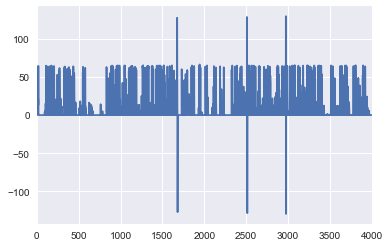

In [185]:
## inspect results
tr1554_events_levels_df.OdomDiff.plot()
plt.show()

Looks like ther are some smaller anomalies (with their corrections) going on in the Odometer. Specifically the notice the negative ones, and the ones with magnitude greater than 75

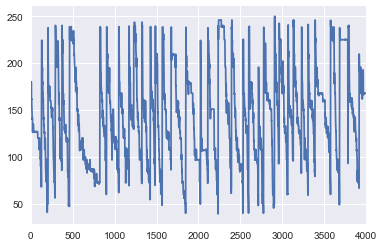

In [186]:
tr1554_events_levels_df.TankLevelGallons.plot()
plt.show()

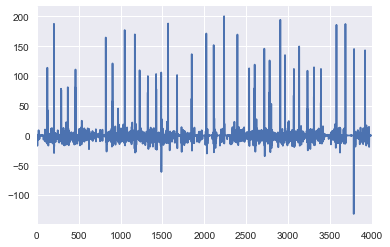

In [187]:
tr1554_events_levels_df.GallonsDiff.plot()
plt.show()

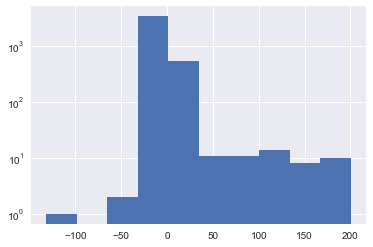

In [188]:
tr1554_events_levels_df.GallonsDiff.hist(log = True)
plt.show()

In [189]:
tr1554_events_levels_df[['Odometer', 'OdomDiff', 'TankLevelGallons', 'GallonsDiff', 
                         'event_mpg']][abs(tr1554_events_levels_df.event_mpg) == np.inf]

,Odometer,OdomDiff,TankLevelGallons,GallonsDiff,event_mpg
95,525250.1,3.7,120.00,0.0,inf
142,525639.0,10.2,179.75,0.0,inf
152,525878.6,11.0,140.25,0.0,inf
167,526110.6,4.2,108.00,0.0,inf
173,526112.0,0.7,119.50,0.0,inf
212,526721.9,0.4,168.00,0.0,inf
213,526722.1,0.2,168.00,0.0,inf
271,527224.3,2.0,97.75,0.0,inf
272,527286.0,61.7,97.75,0.0,inf
299,527436.6,9.0,224.25,0.0,inf


In [190]:
tr1554_events_levels_df[['Odometer', 'OdomDiff', 'TankLevelGallons', 'GallonsDiff', 
                         'event_mpg']][tr1554_events_levels_df.event_mpg == -np.inf]

,Odometer,OdomDiff,TankLevelGallons,GallonsDiff,event_mpg


#### Notice there don't seem to be any negatively infinite values
apparently none of the noisy negative odometer differences ever paird up with a zero Gallons diff

#### Another way to handle the infinite mpgs is to aggregte the sum of deltas:
- by minute
- hour
- day
- week
- month

the aggregated sums will still somewhat polluted, but we can go back and clean the odometer and gallons collums if necessary

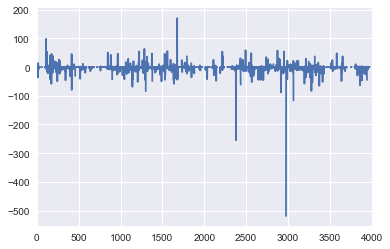

In [191]:
tr1554_events_levels_df.event_mpg.plot()
plt.show()

In [ ]:
colors = {}
tr1554_events_levels_df.event_mpg.plot()
plt.show()

In [286]:
drivers = set(tr1554_events_levels_df.DriverID)
drivers

{nan, 'HILF', 'SHOP1', 'FISDA', 'BROR01', 'LOTG', 'HARMIC', 'JOYGE'}

In [288]:
pltcolors = list({'b', 'g', 'r', 'c', 'm', 'y', 'k', 'w'})
colors = {d : c for d, c in zip (drivers, pltcolors)}
colors

{nan: 'c',
 'HILF': 'k',
 'SHOP1': 'w',
 'FISDA': 'm',
 'BROR01': 'b',
 'LOTG': 'r',
 'HARMIC': 'y',
 'JOYGE': 'g'}

In [318]:
rgbs = [.1, .2, .3, .4, .5, .6, .7, .8, .9, .10, .11, .12, .12]
rgbs = [str(v) for v in rgbs]
colors = {d : c for d,c in zip(drivers, rgbs)}
colors

{nan: '0.1',
 'HILF': '0.2',
 'SHOP1': '0.3',
 'FISDA': '0.4',
 'BROR01': '0.5',
 'LOTG': '0.6',
 'HARMIC': '0.7',
 'JOYGE': '0.8'}

In [324]:
colors = {d : 'C'+str(n) for d,n in zip(drivers, range(1000))}
colors

{nan: 'C0',
 'HILF': 'C1',
 'SHOP1': 'C2',
 'FISDA': 'C3',
 'BROR01': 'C4',
 'LOTG': 'C5',
 'HARMIC': 'C6',
 'JOYGE': 'C7'}

In [325]:
colors['36728'] = 'cyan'
colors['ABBV'] = 'pink'
colors['nan'] = colors[np.nan]

In [326]:
plt.plot(tr1554_events_levels_df.EventTimeStamp,
        tr1554_events_levels_df.event_mpg,
        c = tr1554_events_levels_df.DriverID.astype('str').apply(lambda x: colors[x]))
plt.show()

ValueError: Invalid RGBA argument: 0       C1
1       C1
2       C1
3       C1
4       C1
5       C1
6       C1
7       C1
8       C1
9       C1
10      C1
11      C1
12      C1
13      C1
14      C1
15      C1
16      C1
17      C1
18      C1
19      C1
20      C1
21      C1
22      C1
23      C1
24      C1
25      C1
26      C1
27      C1
28      C1
29      C1
        ..
3966    C6
3967    C6
3968    C6
3969    C6
3970    C6
3971    C6
3972    C6
3973    C6
3974    C0
3975    C0
3976    C0
3977    C0
3978    C0
3979    C0
3980    C0
3981    C0
3982    C0
3983    C0
3984    C0
3985    C0
3986    C0
3987    C0
3988    C0
3989    C0
3990    C0
3991    C0
3992    C0
3993    C0
3994    C0
3995    C0
Name: DriverID, Length: 3996, dtype: object

In [302]:
tr1554_events_levels_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3996 entries, 0 to 3995
Data columns (total 16 columns):
EventTimeStamp       3996 non-null datetime64[ns]
truck                3996 non-null uint32
DriverID             3611 non-null category
Odometer             3996 non-null float64
OdomDiff             3995 non-null float64
TankLevelGallons     3996 non-null float32
GallonsDiff          3995 non-null float32
event_mpg            2937 non-null float64
Speed                3996 non-null uint16
Latitude             3996 non-null float64
Longitude            3996 non-null float64
TankLevelPercent     3996 non-null float32
tankcap              3996 non-null uint16
IgnitionStatus       3996 non-null category
EFReportReason       3996 non-null category
LocationTimeStamp    3996 non-null datetime64[ns]
dtypes: category(3), datetime64[ns](2), float32(3), float64(5), uint16(2), uint32(1)
memory usage: 359.9 KB


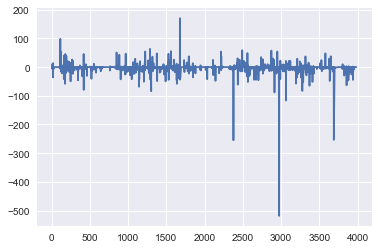

In [196]:
plt.plot(tr1554_events_levels_df.event_mpg.replace([np.inf, -np.inf], np.nan).dropna())
plt.show()

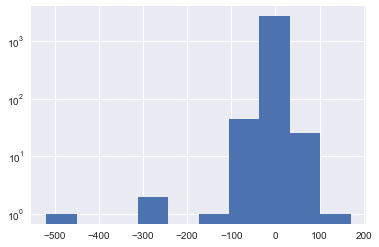

In [192]:
plt.hist(tr1554_events_levels_df.event_mpg.replace([np.inf, -np.inf], np.nan).dropna(),
        log = True)
plt.show()

##### done debugging slice_clean_plot

In [331]:
tr1554_events_levels_df.DriverID = tr1554_events_levels_df.DriverID.astype('str')
tr1554_events_levels_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3996 entries, 0 to 3995
Data columns (total 16 columns):
EventTimeStamp       3996 non-null datetime64[ns]
truck                3996 non-null uint32
DriverID             3996 non-null object
Odometer             3996 non-null float64
OdomDiff             3995 non-null float64
TankLevelGallons     3996 non-null float32
GallonsDiff          3995 non-null float32
event_mpg            2937 non-null float64
Speed                3996 non-null uint16
Latitude             3996 non-null float64
Longitude            3996 non-null float64
TankLevelPercent     3996 non-null float32
tankcap              3996 non-null uint16
IgnitionStatus       3996 non-null category
EFReportReason       3996 non-null category
LocationTimeStamp    3996 non-null datetime64[ns]
dtypes: category(2), datetime64[ns](2), float32(3), float64(5), object(1), uint16(2), uint32(1)
memory usage: 335.9+ KB


In [358]:
sns.pointplot(x = 'EventTimeStamp',
             y = 'event_mpg',
             hue = 'DriverID',
             data = tr1554_events_levels_df)
plt.show()

KeyboardInterrupt: 

# Familiarize myself with bokeh

In [357]:
import bokeh
from bokeh.layouts import gridplot
from bokeh.plotting import figure, show, output_file

In [367]:
p1 = figure(x_axis_type = 'datetime', title = 'Truck 1554 Odometer')
p1.grid.grid_line_alpha = 0.3
p1.axis.axis_label = 'Date'
p1.yaxis.axis_label = 'Price'

p1.line(tr1554_events_levels_df.EventTimeStamp, 
        tr1554_events_levels_df.Odometer, color = '#A6CEE3', legend = 'tr1554')
p1.legend.location = "top_left"

tr1554_array = np.array(tr1554_events_levels_df.Odometer)
tr1554_dates_array = np.array(tr1554_events_levels_df.EventTimeStamp)

window_size = 30
window = np.ones(window_size)/float(window_size)
tr1554_avg = np.convolve(tr1554_array, window, 'same')

p2 = figure(x_axis_type = 'datetime', title = 'tr1554 event_mpg')
p2.grid.grid_line_alpha = 0
p2.xaxis.axis_label = 'Date'
p2.yaxis.axis_label = 'event_mpg'
p2.ygrid.band_fill_color = 'olive'
p2.ygrid.band_fill_alpha = 0.1

p2.circle(tr1554_dates_array, tr1554_array, size = 4, legend = 'close',
         color = 'darkgrey', alpha = 0.2)

p2.line(tr1554_array, tr1554_avg, legend = 'avg', color = 'navy')
p2.legend.location = 'top_left'

output_file('tr1554.html', title = 'timeseries.py example')

show(gridplot([[p1, p2]], plot_width = 400, plot_height = 400))

## Familiarize myself with seaborn

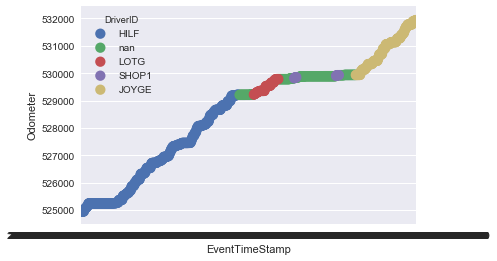

In [336]:
sns.pointplot(x = 'EventTimeStamp',
             y = 'Odometer',
             hue = 'DriverID',
             data = tr1554_events_levels_df[:1000])
plt.show()

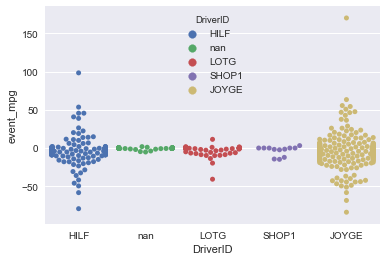

In [356]:
sns.swarmplot(x = 'DriverID',
             y = 'event_mpg',
              hue = 'DriverID',
             data = tr1554_events_levels_df[0:2000])
plt.show()

In [ ]:
sns.swarmplot(x = 'DriverID',
             y = 'event_mpg',
              hue = 'DriverID',
             data = tr1554_events_levels_df)
plt.show()

In [80]:
tips = sns.load_dataset('tips')
titanic = sns.load_dataset("titanic")
iris = sns.load_dataset("iris")

In [ ]:
f, ax = plt.subplots(figsize == (5,6))

In [96]:
sns.set_style('darkgrid')
#sns.set_style('whitegrid')

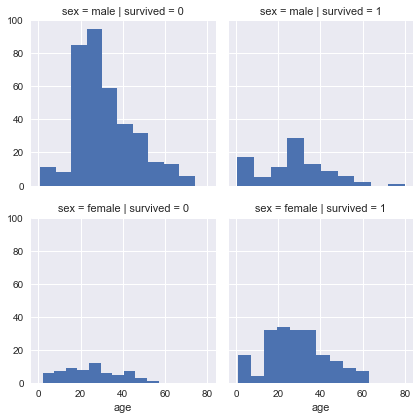

In [97]:
g = sns.FacetGrid(titanic,
                 col = 'survived',
                 row = 'sex')

g = g.map(plt.hist, "age")

plt.show()

In [104]:
tr1554_events_levels_df.DriverID.unique()

[HILF, NaN, LOTG, SHOP1, JOYGE, BROR01, FISDA, HARMIC]
Categories (7, object): [HILF, LOTG, SHOP1, JOYGE, BROR01, FISDA, HARMIC]

In [106]:
type(tr1554_events_levels_df.DriverID[0])

str

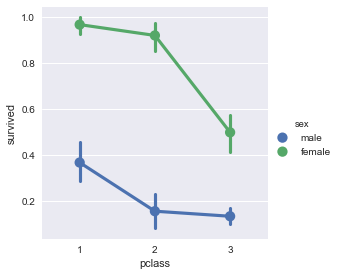

In [120]:
sns.factorplot(x = 'pclass',
               y = 'survived',
               #y = titanic.survived,
              hue = 'sex',
              data = titanic)

plt.show()

In [108]:
titanic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 15 columns):
survived       891 non-null int64
pclass         891 non-null int64
sex            891 non-null object
age            714 non-null float64
sibsp          891 non-null int64
parch          891 non-null int64
fare           891 non-null float64
embarked       889 non-null object
class          891 non-null category
who            891 non-null object
adult_male     891 non-null bool
deck           203 non-null category
embark_town    889 non-null object
alive          891 non-null object
alone          891 non-null bool
dtypes: bool(2), category(2), float64(2), int64(4), object(5)
memory usage: 80.6+ KB


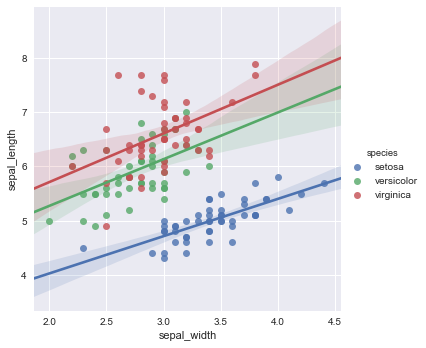

In [99]:
sns.lmplot(x = 'sepal_width',
          y = 'sepal_length',
          hue = 'species',
          data = iris)
plt.show()